In [1]:
import os
import os.path as opath
import pandas as pd
import geopandas as gpd
from mapclassify import UserDefined, Quantiles
import matplotlib.pyplot as plt
import matplotlib.pylab as pl
import numpy as np
from collections import defaultdict

from matplotlib.lines import Line2D

In [2]:
mn_ct_shp = gpd.read_file('/export/scratch/yl4266/SafeGraphData/data/mn_ct_shp/tl_2019_27_tract.shp')

In [3]:
def get_filepath():
    months = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    data_dir = '/export/scratch/yl4266/SafeGraphData/data/SocialDistancing/v2/2020/'
    for m in months:
        if m == 3:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 4:
            for d in range(1, 31):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 5:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 6:
            for d in range(1, 31):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 7:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 8:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 9:
            for d in range(1, 31):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 10:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 11:
            for d in range(1, 31):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 12:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2020-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        
    months = [1, 2, 3, 4]
    data_dir = '/export/scratch/yl4266/SafeGraphData/data/SocialDistancing/v2/2021/'
    for m in months:
        if m == 1:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2021-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 2:
            for d in range(1, 29):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2021-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        elif m == 3:
            for d in range(1, 32):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2021-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d    
        elif m == 4:
            for d in range(1, 11):
                yield opath.join(data_dir, 
                                 '{:02d}'.format(m), 
                                 '{:02d}'.format(d), 
                                 '2021-{:02d}-{:02d}-social-distancing.csv'.format(m, d)), m, d
        

In [6]:
week_labels = ['03/01', '03/08', '03/15', '03/22', '03/29', '04/05', 
               '04/12', '04/19', '04/26', '05/03', '05/10', '05/17',
               '05/24', '05/31', '06/07', '06/14', '06/21', '06/28',
               '07/05', '07/12', '07/19', '07/26', '08/02', '08/09',
               '08/16', '08/23', '08/30', '09/06', '09/13', '09/20',
               '09/27', '10/04', '10/11', '10/18', '10/25', '11/01',
               '11/08', '11/15', '11/22', '11/29', '12/06', '12/13',
               '12/20', '12/27', '01/03', '01/10', '01/17', '01/24',
               '01/31', '02/07', '02/14', '02/21', '02/28', '03/07',
               '03/14', '03/21', '03/28', '04/04'
              ]

In [5]:
week_labels = ['03/01 - 03/07', '03/08 - 03/14', '03/15 - 03/21',
               '03/22 - 03/28', '03/29 - 04/04', '04/05 - 04/11', 
               '04/12 - 04/18', '04/19 - 04/25', '04/26 - 05/02',
               '05/03 - 05/09', '05/10 - 05/16', '05/17 - 05/23',
               '05/24 - 05/30', '05/31 - 06/06', '06/07 - 06/13',
               '06/14 - 06/20', '06/21 - 06/27', '06/28 - 07/04',
               '07/05 - 07/11', '07/12 - 07/18', '07/19 - 07/25',
               '07/26 - 08/01', '08/02 - 08/08', '08/09 - 08/15',
               '08/16 - 08/22', '08/23 - 08/29', '08/30 - 09/05',
               '09/06 - 09/12', '09/13 - 09/19', '09/20 - 09/26',
               '09/27 - 10/03', '10/04 - 10/10', '10/11 - 10/17',
               '10/18 - 10/24', '10/25 - 10/31', '11/01 - 11/07',
               '11/08 - 11/14', '11/15 - 11/21', '11/22 - 11/28',
               '11/29 - 12/05', '12/06 - 12/12', '12/13 - 12/19',
               '12/20 - 12/26', '12/27 - 01/02'
              ]

In [7]:
def get_aggregated_df(df: pd.DataFrame):
    df['ct_fips'] = df['origin_census_block_group'].str.slice(stop=11)
    df['total_distance_traveled_from_home'] = df['distance_traveled_from_home'] * df['device_count']
    df['total_median_home_dwell_time'] = df['median_home_dwell_time'] * df['device_count']
    agg_df = df[['ct_fips', 'device_count', 'total_distance_traveled_from_home', 'total_median_home_dwell_time']].groupby('ct_fips').sum().reset_index()
    agg_df['avg_distance_traveled_from_home'] = agg_df['total_distance_traveled_from_home'] / agg_df['device_count']
    agg_df['avg_median_home_dwell_time'] = df['total_median_home_dwell_time'] / agg_df['device_count']
    return agg_df[['ct_fips', 'device_count', 'avg_distance_traveled_from_home', 'avg_median_home_dwell_time']]

In [8]:
datasets = []

for filepath, m, d in get_filepath():
    input_csv = pd.read_csv(filepath, dtype={'origin_census_block_group': str})
    datasets.append((get_aggregated_df(input_csv), m, d))

In [9]:
metropolitan_county_fips = ['053', '163', '123', '139', '037', '003', '019']

metropolitan_ct_shp = mn_ct_shp.loc[mn_ct_shp['COUNTYFP'].isin(metropolitan_county_fips)]

In [73]:
all_dist = None

for data, _, _ in datasets:
    if all_dist is None:
        all_dist = data['avg_distance_traveled_from_home']
    else:
        all_dist.append(data['avg_distance_traveled_from_home'], ignore_index=True)
        
all_dist.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count      1333.000000
mean      12809.060979
std       23141.986694
min         383.000000
0%          383.000000
20%        6062.755556
40%        7741.249524
50%        8634.000000
60%       10037.688723
80%       17341.571645
100%     730238.867368
max      730238.867368
Name: avg_distance_traveled_from_home, dtype: float64

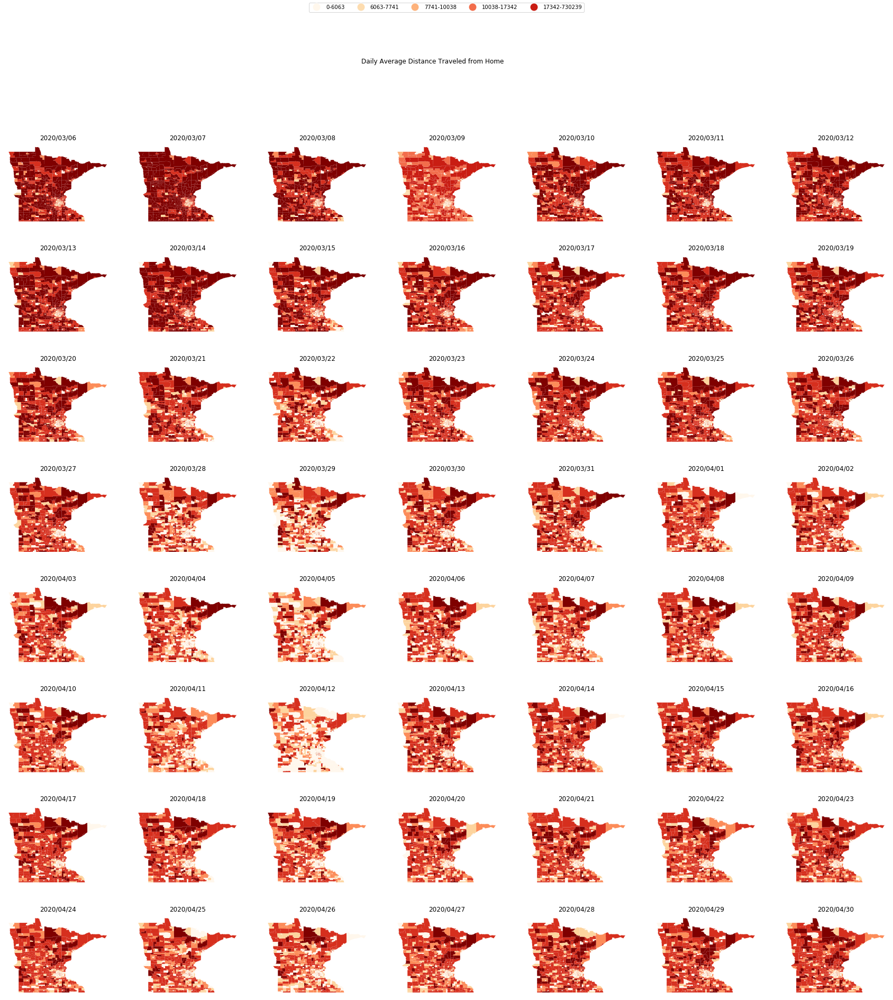

In [114]:
fig, axs = plt.subplots(len(datasets)//7, 7, figsize=(30,30))
fig.suptitle('Daily Average Distance Traveled from Home', y = 0.95)

bins = Quantiles(all_dist, 5).bins

plt_num = 0
for data, m, d in datasets:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num//7, plt_num%7].set_title('2020/{:02d}/{:02d}'.format(m, d))
    axs[plt_num//7, plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['avg_distance_traveled_from_home'], bins).yb).plot(column='cl', ax=axs[plt_num//7, plt_num%7], cmap='OrRd')
    plt_num += 1

cm = plt.get_cmap('OrRd')

legend_elements = []
prev_b = 0
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

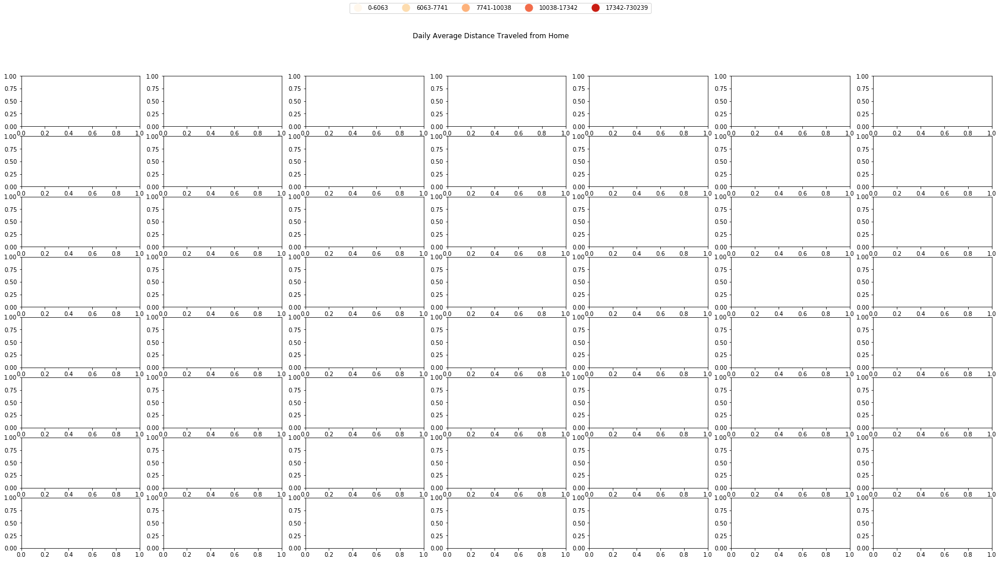

In [112]:
fig, axs = plt.subplots(len(datasets)//7, 7, figsize=(30,15))
fig.suptitle('Daily Average Distance Traveled from Home', y = 0.95)

cm = plt.get_cmap('OrRd')

legend_elements = []
prev_b = 0
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins),)
plt.show()

In [115]:
all_time = None

for data, _, _ in datasets:
    if all_time is None:
        all_time = data['avg_median_home_dwell_time']
    else:
        all_time.append(data['avg_median_home_dwell_time'], ignore_index=True)
        
all_time.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count    1333.000000
mean      179.655456
std       272.919364
min         0.000000
0%          0.000000
20%        33.557983
40%        82.690923
50%       108.375000
60%       140.563066
80%       257.866702
100%     5216.363636
max      5216.363636
Name: avg_median_home_dwell_time, dtype: float64

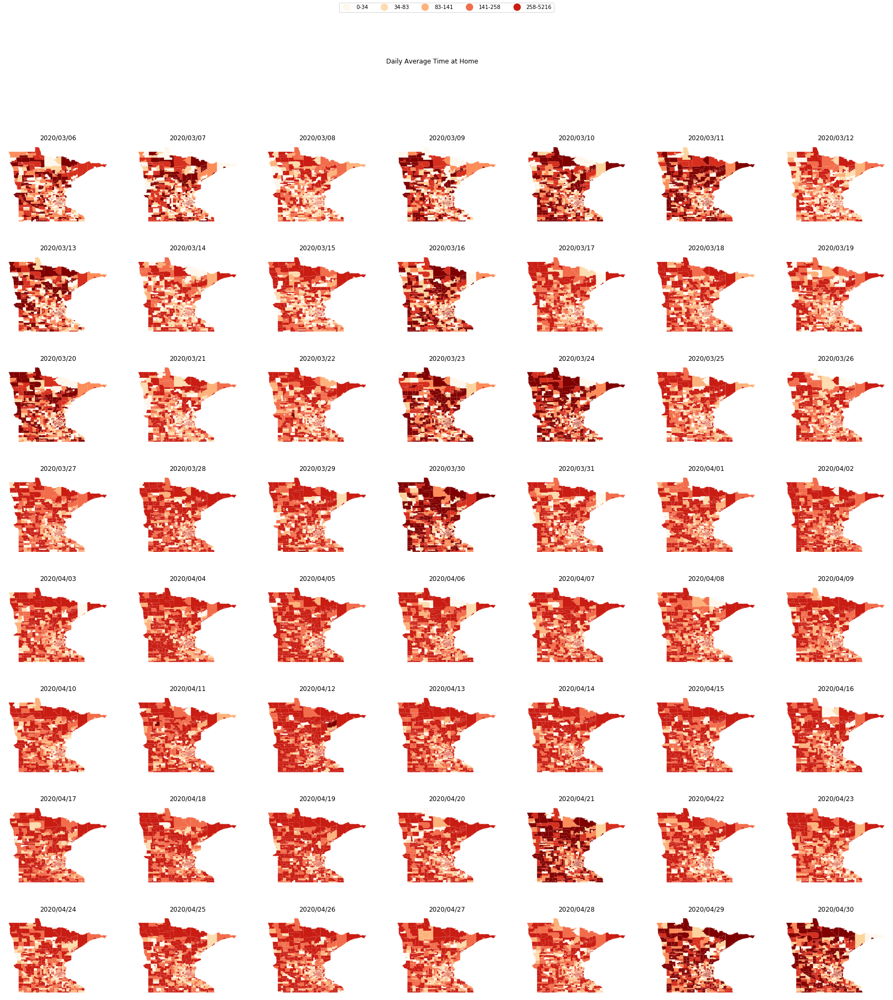

In [116]:
fig, axs = plt.subplots(len(datasets)//7, 7, figsize=(30,30))
fig.suptitle('Daily Average Time at Home', y = 0.95)

bins = Quantiles(all_time, 5).bins

plt_num = 0
for data, m, d in datasets:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num//7, plt_num%7].set_title('2020/{:02d}/{:02d}'.format(m, d))
    axs[plt_num//7, plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['avg_median_home_dwell_time'], bins).yb).plot(column='cl', ax=axs[plt_num//7, plt_num%7], cmap='OrRd')
    plt_num += 1

cm = plt.get_cmap('OrRd')

legend_elements = []
prev_b = 0
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [133]:
all_dist = None

for data, _, _ in datasets:
    input_csv = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    if all_dist is None:
        all_dist = input_csv['avg_distance_traveled_from_home']
    else:
        all_dist.append(input_csv['avg_distance_traveled_from_home'], ignore_index=True)
all_dist.describe([0, 0.2, 0.4, 0.6, 0.8, 1])     

count       702.000000
mean       9364.210653
std       27438.853508
min         383.000000
0%          383.000000
20%        6238.186667
40%        7233.114627
50%        7761.763807
60%        8205.011728
80%        9703.910160
100%     730238.867368
max      730238.867368
Name: avg_distance_traveled_from_home, dtype: float64

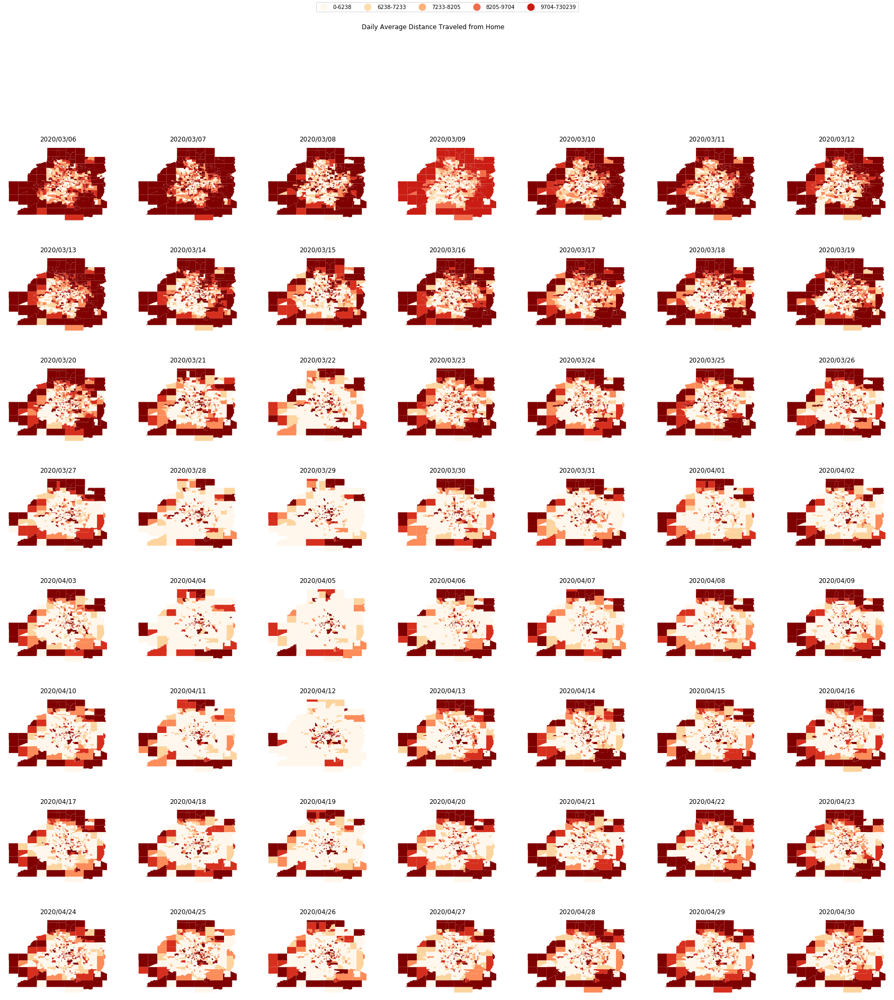

In [135]:
fig, axs = plt.subplots(len(datasets)//7, 7, figsize=(30,30))
fig.suptitle('Daily Average Distance Traveled from Home')

bins = Quantiles(all_dist, 5).bins

plt_num = 0
for data, m, d in datasets:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num//7, plt_num%7].set_title('2020/{:02d}/{:02d}'.format(m, d))
    axs[plt_num//7, plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['avg_distance_traveled_from_home'], bins).yb).plot(column='cl', ax=axs[plt_num//7, plt_num%7], cmap='OrRd')
    plt_num += 1

cm = plt.get_cmap('OrRd')

legend_elements = []
prev_b = 0
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [136]:
all_time = None

for data, _, _ in datasets:
    data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    if all_time is None:
        all_time = data['avg_median_home_dwell_time']
    else:
        all_time.append(data['avg_median_home_dwell_time'], ignore_index=True)
        
all_time.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count     702.000000
mean      182.952418
std       300.741262
min         0.000000
0%          0.000000
20%        31.127523
40%        80.702287
50%       106.576853
60%       137.096408
80%       265.574723
100%     5216.363636
max      5216.363636
Name: avg_median_home_dwell_time, dtype: float64

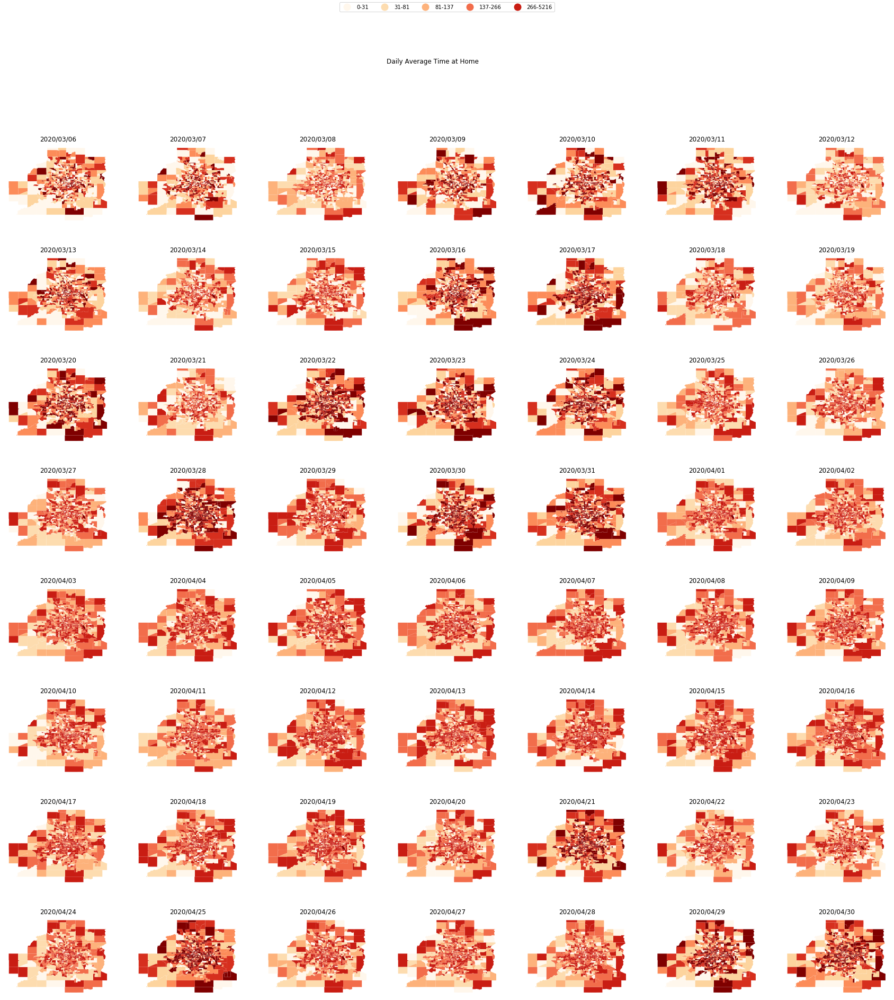

In [138]:
fig, axs = plt.subplots(len(datasets)//7, 7, figsize=(30,30))
fig.suptitle('Daily Average Time at Home', y=0.95)

bins = Quantiles(all_time, 5).bins

plt_num = 0
for data, m, d in datasets:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num//7, plt_num%7].set_title('2020/{:02d}/{:02d}'.format(m, d))
    axs[plt_num//7, plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['avg_median_home_dwell_time'], bins).yb).plot(column='cl', ax=axs[plt_num//7, plt_num%7], cmap='OrRd')
    plt_num += 1

cm = plt.get_cmap('OrRd')

legend_elements = []
prev_b = 0
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [15]:
m_d_datasets = defaultdict(dict)

for data, m, d in datasets:
    m_d_datasets[m][d] = data

In [10]:
def get_diff(day):
    if day == 'Fri.':
        month_day = [(3,6),(3,13),(3,20),(3,27),(4,3),(4,10),(4,17),(4,24)]
    elif day == 'Sat.':
        month_day = [(3,7),(3,14),(3,21),(3,28),(4,4),(4,11),(4,18),(4,25)]
    elif day == 'Sun.':
        month_day = [(3,8),(3,15),(3,22),(3,29),(4,5),(4,12),(4,19),(4,26)]
    elif day == 'Mon.':
        month_day = [(3,9),(3,16),(3,23),(3,30),(4,6),(4,13),(4,20),(4,27)]
    elif day == 'Tue.':
        month_day = [(3,10),(3,17),(3,24),(3,31),(4,7),(4,14),(4,21),(4,28)]
    elif day == 'Wed.':
        month_day = [(3,11),(3,18),(3,25),(4,1),(4,8),(4,15),(4,22),(4,29)]
    else:
        month_day = [(3,12),(3,19),(3,26),(4,2),(4,9),(4,16),(4,23),(4,30)]
    
    previous = None
    pre_df = None
    current = None
    cur_df = None
    for current in month_day:
        cur_df = m_d_datasets[current[0]][current[1]]
        if previous is None:
            previous = current
            pre_df = cur_df
        else:
            result = pre_df.merge(cur_df, left_on='ct_fips', right_on='ct_fips',
                                  suffixes=('_pre', '_cur'))
            result['diff'] = result['avg_distance_traveled_from_home_cur'] - result['avg_distance_traveled_from_home_pre']
            result['diff2'] = result['avg_median_home_dwell_time_cur'] - result['avg_median_home_dwell_time_pre']
            yield result, previous, current
        

In [16]:
weekday_datasets = []
for day in ['Fri.', 'Sat.', 'Sun.', 'Mon.', 'Tue.', 'Wed.', 'Thu']:
    for e in get_diff(day):
        weekday_datasets.append(e)

In [145]:
last_week_dist = None

for data, _, _ in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    if last_week_dist is None:
        last_week_dist = data['diff']
    else:
        last_week_dist.append(data['diff'], ignore_index=True)

last_week_dist.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count      1333.000000
mean      -4497.988017
std       22511.564359
min     -726107.487368
0%      -726107.487368
20%       -6130.116272
40%       -3088.510346
50%       -2358.863372
60%       -1591.493411
80%        -198.800000
100%      77121.892148
max       77121.892148
Name: diff, dtype: float64

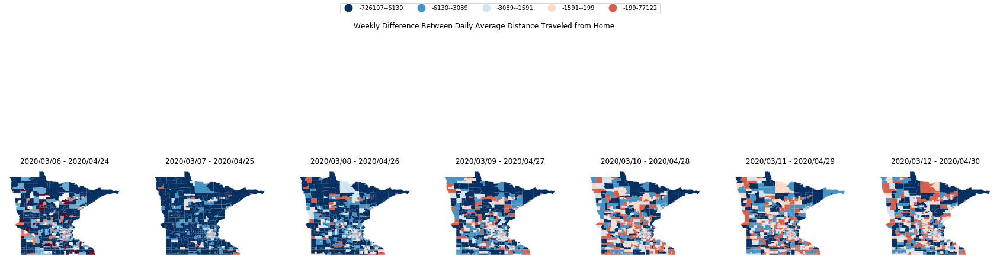

In [146]:
fig, axs = plt.subplots(1, 7, figsize=(30,10))
fig.suptitle('Weekly Difference Between Daily Average Distance Traveled from Home', y=0.95)

bins = Quantiles(last_week_dist, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%7].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff'], bins).yb).plot(column='cl', ax=axs[plt_num%7], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = last_week_dist.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

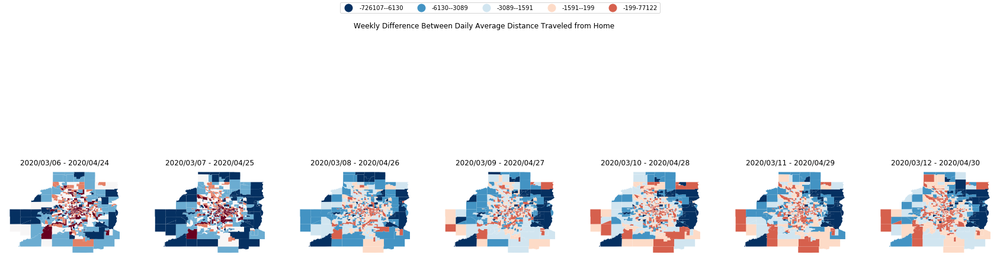

In [147]:
fig, axs = plt.subplots(1, 7, figsize=(30,10))
fig.suptitle('Weekly Difference Between Daily Average Distance Traveled from Home', y=0.95)

bins = Quantiles(last_week_dist, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%7].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff'], bins).yb).plot(column='cl', ax=axs[plt_num%7], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = last_week_dist.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [142]:
all_dist = None

for data, _, _ in weekday_datasets:
    if all_dist is None:
        all_dist = data['diff']
    else:
        all_dist.append(data['diff'], ignore_index=True)

all_dist.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count      1333.000000
mean       -622.742679
std       10543.464370
min     -128445.642121
0%      -128445.642121
20%       -2566.271523
40%        -938.894114
50%        -476.338981
60%        -104.543705
80%        1187.374483
100%     144913.000000
max      144913.000000
Name: diff, dtype: float64

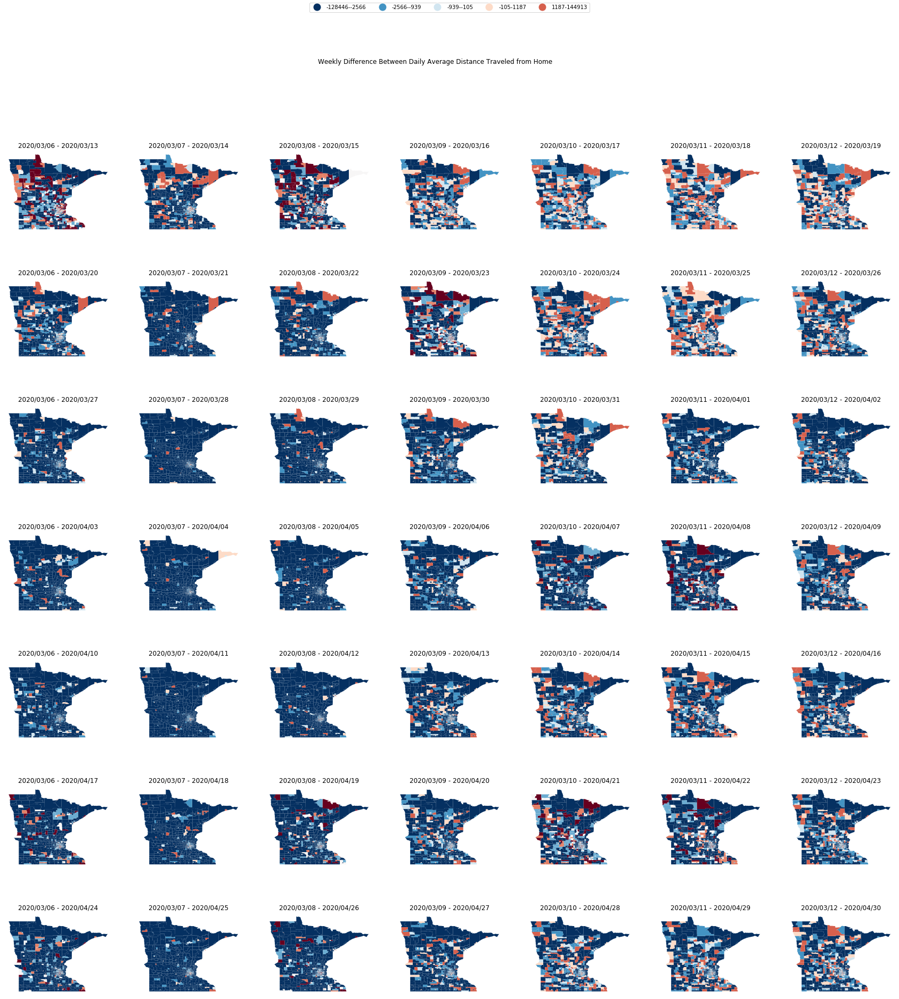

In [148]:
fig, axs = plt.subplots(len(datasets)//7 - 1, 7, figsize=(30,30))
fig.suptitle('Weekly Difference Between Daily Average Distance Traveled from Home', y=0.95)

bins = Quantiles(all_dist, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff'], bins).yb).plot(column='cl', ax=axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = all_dist.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

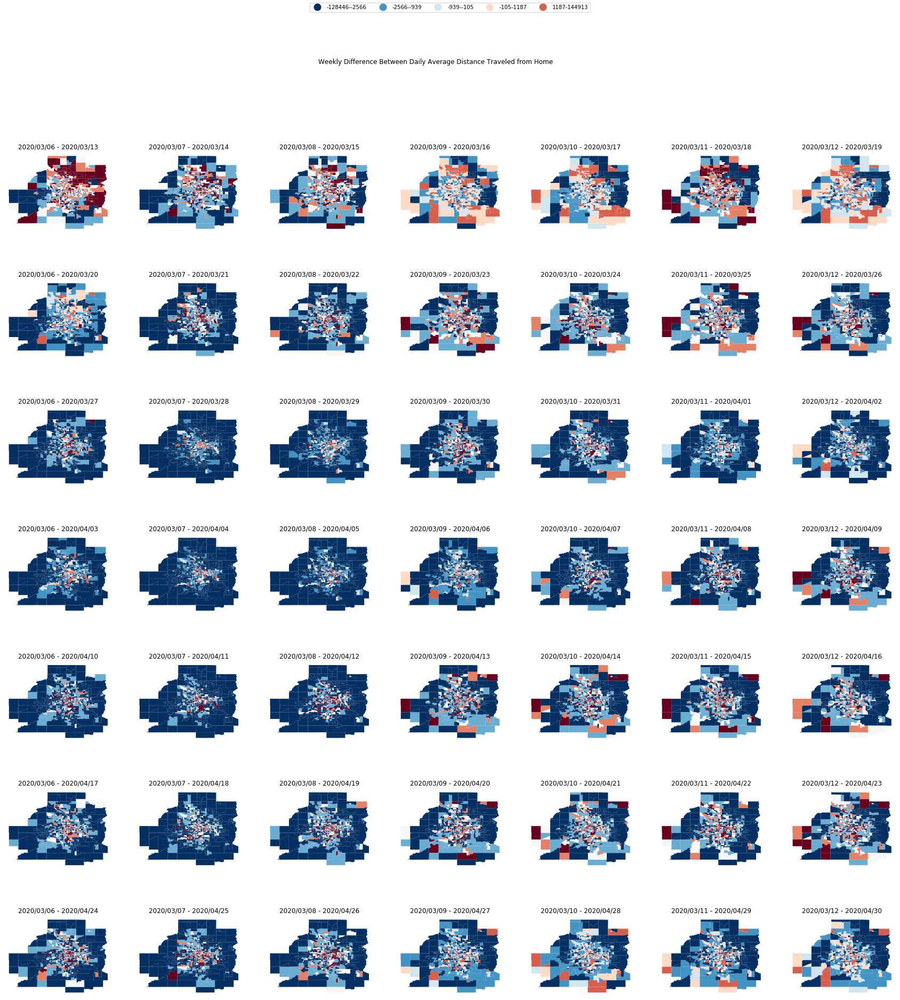

In [149]:
fig, axs = plt.subplots(len(datasets)//7 - 1, 7, figsize=(30,30))
fig.suptitle('Weekly Difference Between Daily Average Distance Traveled from Home', y=0.95)

bins = Quantiles(all_dist, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff'], bins).yb).plot(column='cl', ax=axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = all_dist.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [150]:
last_week_time = None

for data, _, _ in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    if last_week_time is None:
        last_week_time = data['diff2']
    else:
        last_week_time.append(data['diff2'], ignore_index=True)

last_week_time.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count    1333.000000
mean      148.768711
std       485.882084
min     -2521.720588
0%      -2521.720588
20%       -51.896239
40%        31.805721
50%        75.610793
60%       120.788243
80%       282.617173
100%     7077.234409
max      7077.234409
Name: diff2, dtype: float64

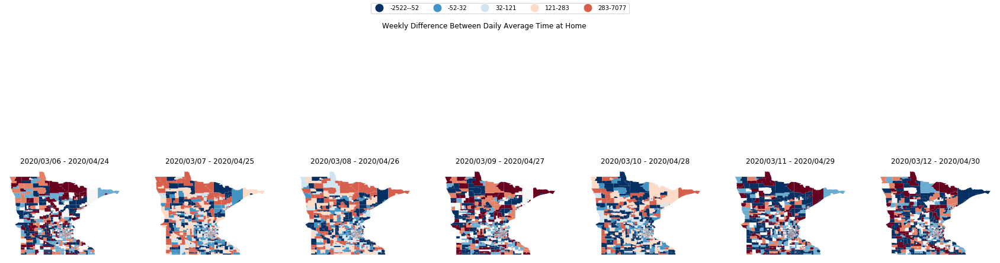

In [151]:
fig, axs = plt.subplots(1, 7, figsize=(30,10))
fig.suptitle('Weekly Difference Between Daily Average Time at Home', y=0.95)

bins = Quantiles(last_week_time, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%7].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff2'], bins).yb).plot(column='cl', ax=axs[plt_num%7], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = last_week_time.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

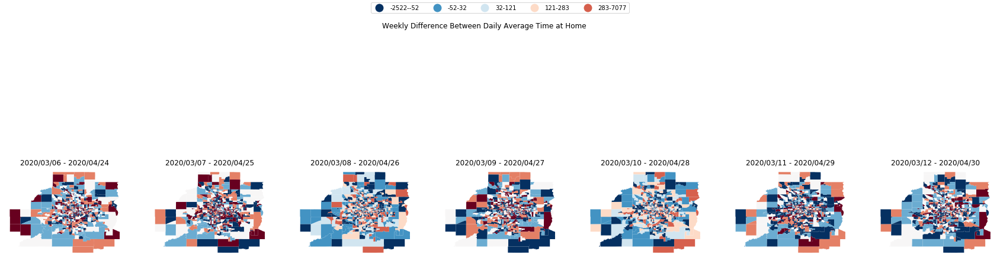

In [152]:
fig, axs = plt.subplots(1, 7, figsize=(30,10))
fig.suptitle('Weekly Difference Between Daily Average Time at Home', y=0.95)

bins = Quantiles(last_week_time, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets[len(weekday_datasets)//7 - 1::7]:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%7].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%7].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff2'], bins).yb).plot(column='cl', ax=axs[plt_num%7], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = last_week_time.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [154]:
all_time = None

for data, _, _ in weekday_datasets:
    if all_time is None:
        all_time = data['diff2']
    else:
        all_time.append(data['diff2'], ignore_index=True)

all_time.describe([0, 0.2, 0.4, 0.6, 0.8, 1])

count    1333.000000
mean       23.842035
std       333.941162
min     -3988.181818
0%      -3988.181818
20%      -104.859668
40%       -16.297094
50%        11.231643
60%        45.631913
80%       158.775278
100%     2409.745684
max      2409.745684
Name: diff2, dtype: float64

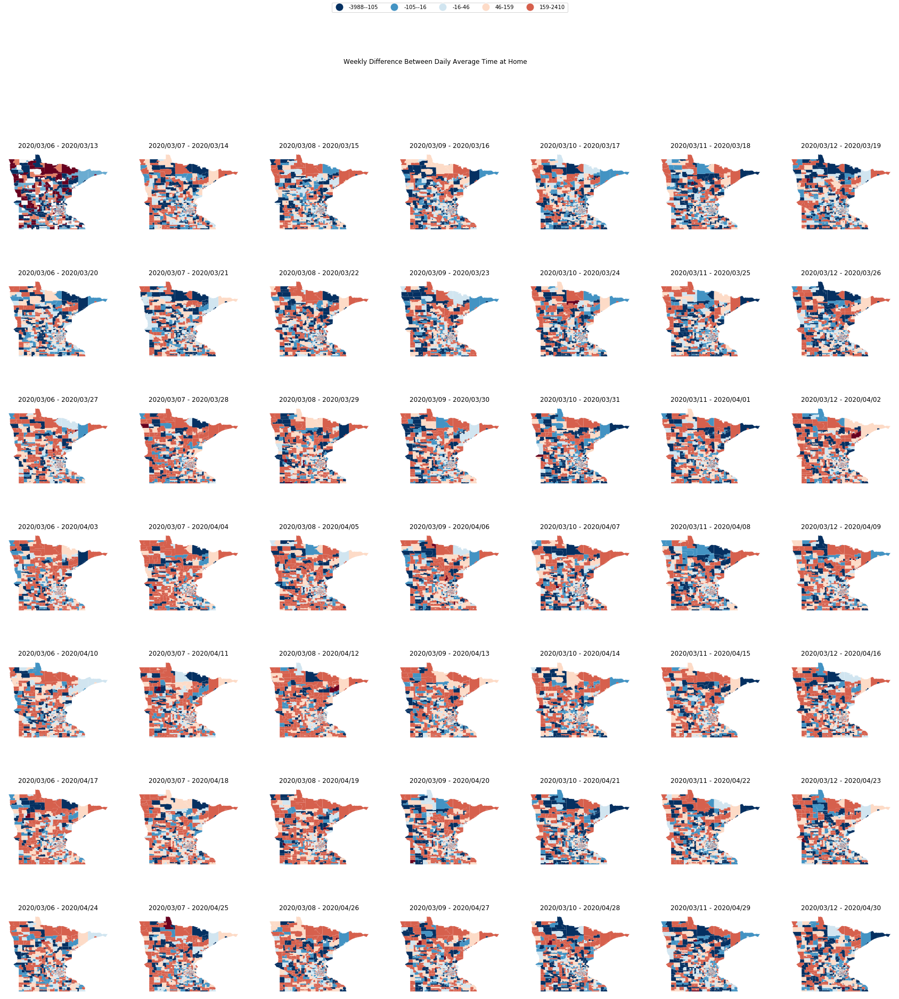

In [155]:
fig, axs = plt.subplots(len(datasets)//7 - 1, 7, figsize=(30,30))
fig.suptitle('Weekly Difference Between Daily Average Time at Home', y=0.95)

bins = Quantiles(all_time, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets:
    result_csv = mn_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff2'], bins).yb).plot(column='cl', ax=axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = all_time.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

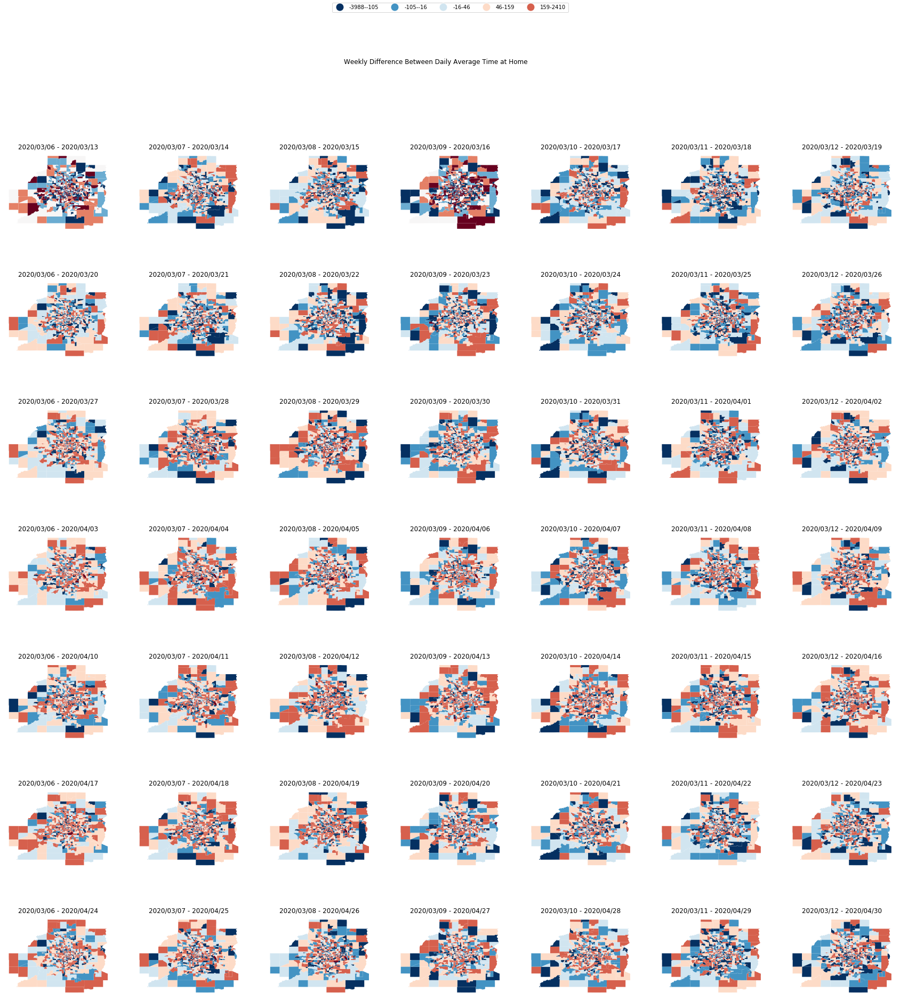

In [156]:
fig, axs = plt.subplots(len(datasets)//7 - 1, 7, figsize=(30,30))
fig.suptitle('Weekly Difference Between Daily Average Time at Home', y=0.95)

bins = Quantiles(all_time, 5).bins

plt_num = 0
for data, prev, curr in weekday_datasets:
    result_csv = metropolitan_ct_shp.merge(data, left_on='GEOID', right_on='ct_fips')
    
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].set_title('2020/{:02d}/{:02d} - 2020/{:02d}/{:02d}'.format(prev[0], prev[1], curr[0], curr[1]))
    axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)].axis('off')
    result_csv.assign(cl=UserDefined(result_csv['diff2'], bins).yb).plot(column='cl', ax=axs[plt_num%(len(datasets)//7 - 1), plt_num//(len(datasets)//7 - 1)], cmap='RdBu_r')
    plt_num += 1

cm = plt.get_cmap('RdBu_r')

legend_elements = []
prev_b = all_time.min()
for b_idx, b in enumerate(bins):
    legend_elements.append(
        Line2D([0], [0], marker='o', markerfacecolor=cm(b_idx / len(bins)), color='w',
              label='{:.0f}-{:.0f}'.format(prev_b, b), markersize=15)
    )
    prev_b = b

fig.legend(handles=legend_elements, loc='upper center', ncol=len(bins))
plt.show()

In [8]:
agg_devices = None

for data, _, _ in datasets:
    df = data.set_index('ct_fips')
    if agg_devices is None:
        agg_devices = df['device_count']
    else:
        agg_devices = agg_devices + df['device_count']

agg_devices = agg_devices / len(datasets)

In [7]:
rurality_df = pd.read_csv('/export/scratch/yl4266/SafeGraphData/data/Rurality/CensusTractRurality.csv', dtype={'GEOID': str})

In [8]:
rurality_device_df = rurality_df.merge(agg_devices, left_on='GEOID', right_on='ct_fips')

In [10]:
census_df = pd.read_csv('/export/scratch/yl4266/SafeGraphData/data/census/mn/DECENNIALSF12010.csv', dtype={'GEOID': str})

In [11]:
census_df['GEOID'] = census_df['GEOID'].str.slice(start=9)

In [11]:
rurality_device_census_df = rurality_device_df.merge(census_df, left_on='GEOID', right_on='GEOID')

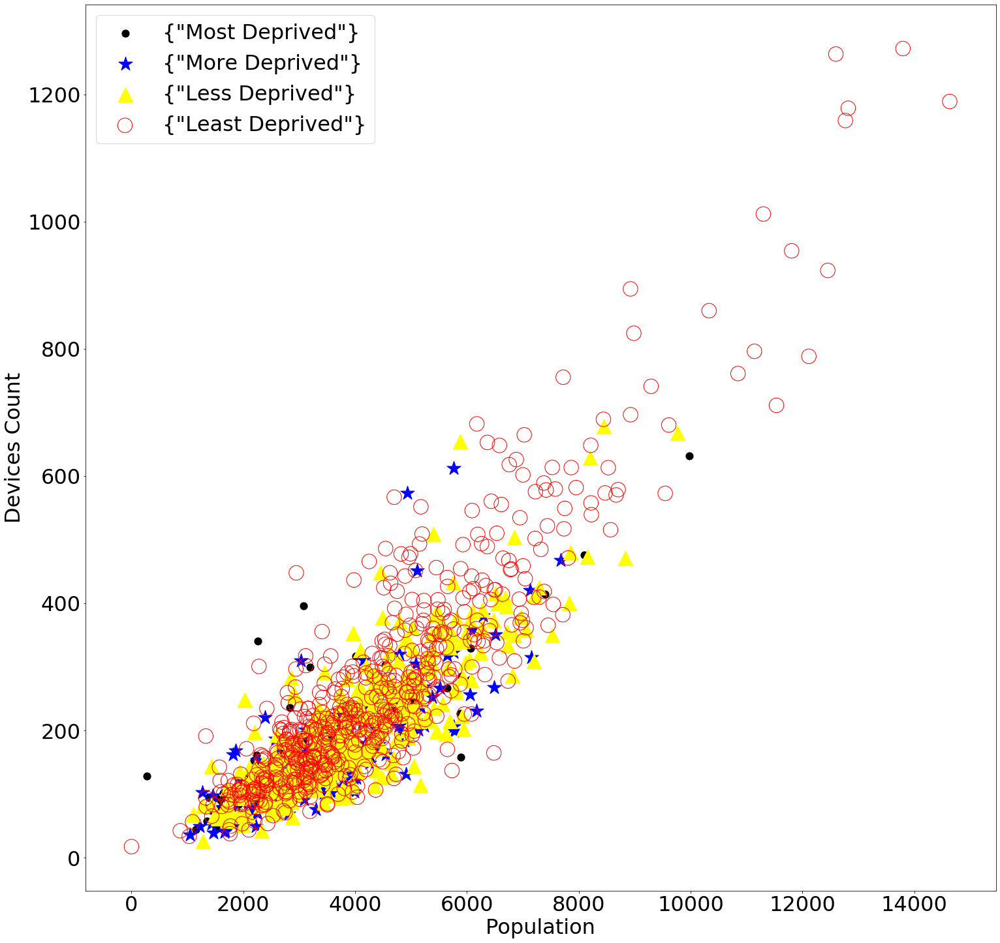

In [19]:
plt.figure(figsize=(25,25))
lines = []

sub = rurality_device_census_df[rurality_device_census_df['Rurality']=='{\"Most Deprived\"}']
lines.append(plt.scatter(sub['Population'], sub['device_count'], c='black', marker='.', s=500))

sub = rurality_device_census_df[rurality_device_census_df['Rurality']=='{\"More Deprived\"}']
lines.append(plt.scatter(sub['Population'], sub['device_count'], c='blue', marker='*', s=500))

sub = rurality_device_census_df[rurality_device_census_df['Rurality']=='{\"Less Deprived\"}']
lines.append(plt.scatter(sub['Population'], sub['device_count'], c='yellow', marker='^', s=500))

sub = rurality_device_census_df[rurality_device_census_df['Rurality']=='{\"Least Deprived\"}']
lines.append(plt.scatter(sub['Population'], sub['device_count'], facecolors='none', edgecolors='r', s=500))
    

plt.ylabel('Devices Count', fontsize=32)
plt.xlabel('Population', fontsize=32)
plt.yticks(fontsize=32)
plt.xticks(fontsize=32)
plt.legend(lines, 
           ['{\"Most Deprived\"}', '{\"More Deprived\"}', '{\"Less Deprived\"}', '{\"Least Deprived\"}'],
           fontsize=32)
plt.show()

In [12]:
rurality_device_census_df = rurality_device_census_df[['GEOID', 'CountyId', 'longitude', 'latitude', 'NewRegions', 'Rurality', 'device_count', 'Geographic Area Name','Population']]

In [16]:
rurality_device_census_df

,GEOID,CountyId,longitude,latitude,NewRegions,Rurality,device_count,Geographic Area Name,Population
0,27021960802,27021,-94.568529,46.443903,MWest,"{""Less Deprived""}",230.428571,"Census Tract 9608.02, Cass County, Minnesota",4364
1,27021960100,27021,-93.922617,47.079579,MWest,"{""Less Deprived""}",98.595238,"Census Tract 9601, Cass County, Minnesota",2062
2,27021940001,27021,-94.534882,47.097422,MWest,"{""Less Deprived""}",177.023810,"Census Tract 9400.01, Cass County, Minnesota",3860
3,27021960600,27021,-94.518634,46.838074,MWest,"{""Less Deprived""}",157.428571,"Census Tract 9606, Cass County, Minnesota",2959
4,27021960200,27021,-94.174765,46.993168,MWest,"{""Less Deprived""}",109.928571,"Census Tract 9602, Cass County, Minnesota",2305
...,...,...,...,...,...,...,...,...,...
1251,27085950200,27085,-94.376411,44.894328,MWest,"{""Least Deprived""}",283.095238,"Census Tract 9502, McLeod County, Minnesota",4191
1252,27085950400,27085,-94.376563,44.896244,MWest,"{""Least Deprived""}",471.309524,"Census Tract 9504, McLeod County, Minnesota",7810
1253,27085950100,27085,-94.137110,44.932631,MWest,"{""Least Deprived""}",328.642857,"Census Tract 9501, McLeod County, Minnesota",5454
1254,27085950500,27085,-94.376651,44.719565,MWest,"{""Least Deprived""}",177.523810,"Census Tract 9505, McLeod County, Minnesota",2926


In [13]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

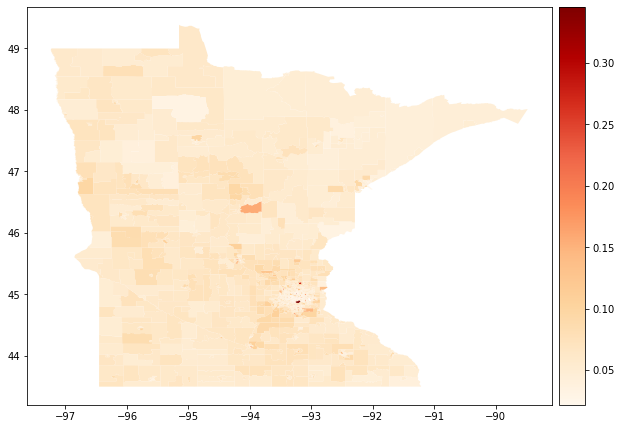

In [14]:
census_device_df = census_df.merge(agg_devices, left_on='GEOID', right_on='ct_fips')
census_device_shp = mn_ct_shp.merge(census_device_df, left_on='GEOID', right_on='GEOID')
census_device_shp['selection_ratio'] = census_device_shp['device_count'] / census_device_shp['Population']

fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

census_device_shp.plot(column='selection_ratio', legend=True, ax=ax, cmap='OrRd', cax=cax)

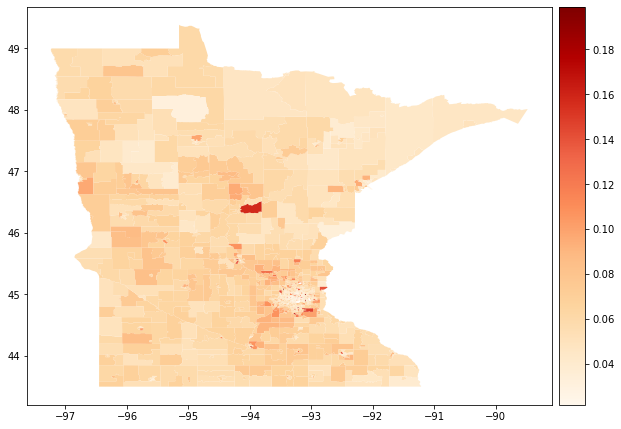

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

census_device_shp[census_device_shp['selection_ratio']<0.2].plot(column='selection_ratio', legend=True, ax=ax, cmap='OrRd', cax=cax)

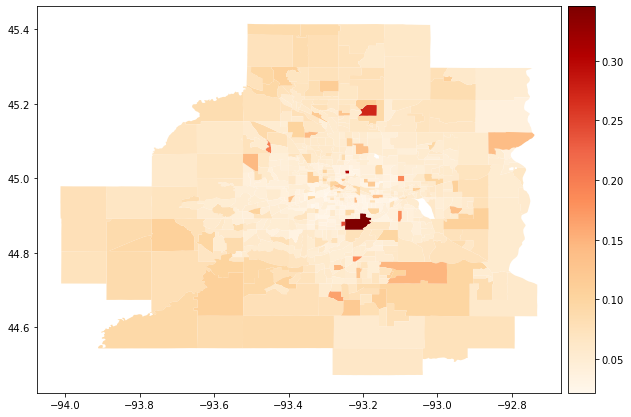

In [20]:
census_device_df = census_df.merge(agg_devices, left_on='GEOID', right_on='ct_fips')
census_device_shp = metropolitan_ct_shp.merge(census_device_df, left_on='GEOID', right_on='GEOID')
census_device_shp['selection_ratio'] = census_device_shp['device_count'] / census_device_shp['Population']

fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

census_device_shp.plot(column='selection_ratio', legend=True, ax=ax, cmap='OrRd', cax=cax)

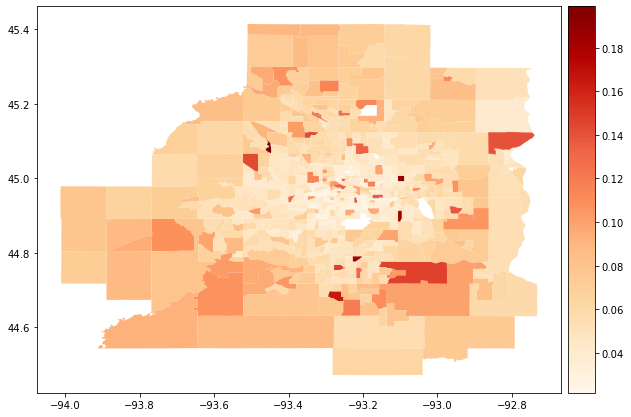

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

census_device_shp[census_device_shp['selection_ratio']<0.2].plot(column='selection_ratio', legend=True, ax=ax, cmap='OrRd', cax=cax)

In [27]:
census_device_shp[census_device_shp['selection_ratio']>=0.2]

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,Geographic Area Name,Population,device_count,selection_ratio
45,27,003,050819,27003050819,508.19,Census Tract 508.19,G5020,S,9410768,678707,+45.1759380,-093.1840182,"POLYGON ((-93.21198 45.16781, -93.21141 45.168...","Census Tract 508.19, Anoka County, Minnesota",2947,805.724026,0.273405
137,27,053,001100,27053001100,11,Census Tract 11,G5020,S,646069,0,+45.0167956,-093.2422222,"POLYGON ((-93.24734 45.01677, -93.24730 45.016...","Census Tract 11, Hennepin County, Minnesota",2027,627.691558,0.309665
165,27,053,980000,27053980000,9800,Census Tract 9800,G5020,S,17102615,780576,+44.8837896,-093.2123416,"POLYGON ((-93.24798 44.86227, -93.24798 44.863...","Census Tract 9800, Hennepin County, Minnesota",278,96.126623,0.345779
191,27,053,024902,27053024902,249.02,Census Tract 249.02,G5020,S,1000339,2309,+44.8781528,-093.2537046,"POLYGON ((-93.25798 44.88349, -93.25671 44.883...","Census Tract 249.02, Hennepin County, Minnesota",2383,580.636364,0.243658


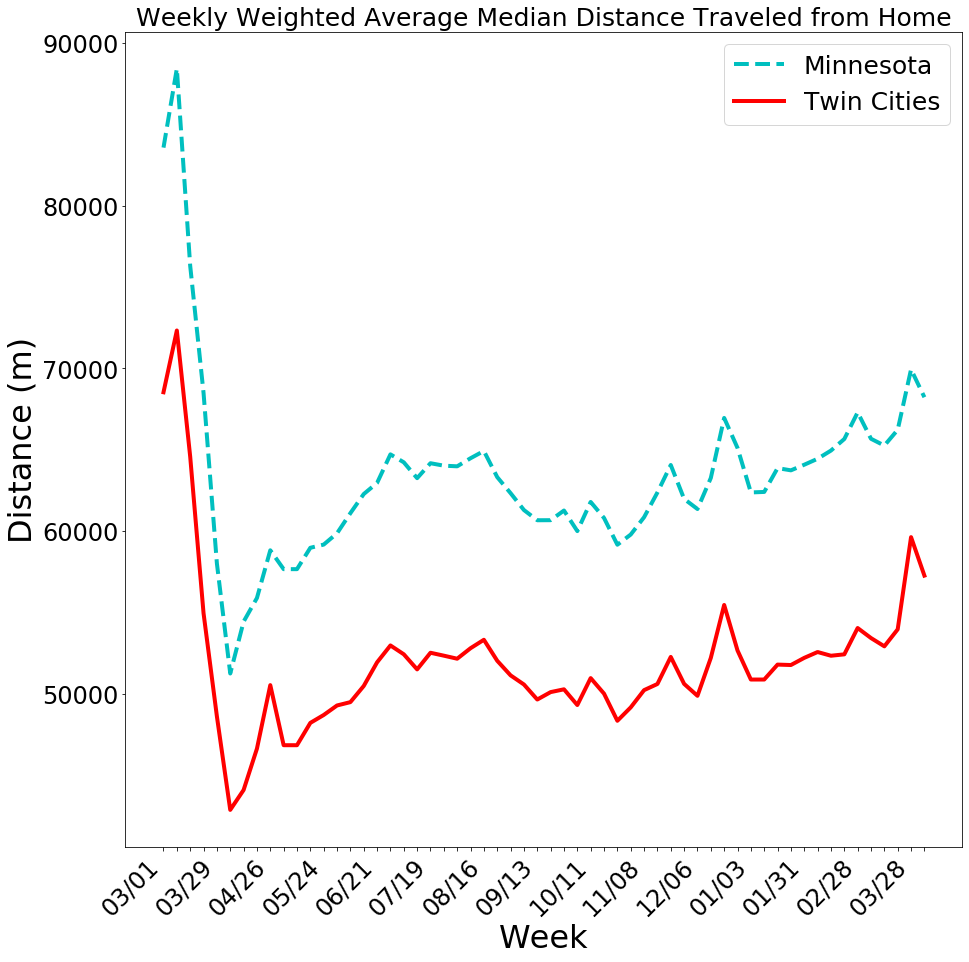

In [15]:
state_avg_dists = np.zeros(len(datasets)//7)
state_device_counts = np.zeros(len(datasets)//7)

metro_avg_dists = np.zeros(len(datasets)//7)
metro_device_counts = np.zeros(len(datasets)//7)

plt_num = 0
for data, _, _ in datasets:
    state_avg_dists[plt_num//7] += (data['avg_distance_traveled_from_home'] * data['device_count']).sum() / data['device_count'].sum()
#     state_device_counts[plt_num//7] += data['device_count'].sum()
    
    metro_data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    metro_avg_dists[plt_num//7] += (metro_data['avg_distance_traveled_from_home'] * metro_data['device_count']).sum() / metro_data['device_count'].sum()
#     metro_device_counts[plt_num//7] += metro_data['device_count'].sum()
    
    plt_num += 1
    
# state_avg_dists = state_avg_dists / state_device_counts
# metro_avg_dists = metro_avg_dists / metro_device_counts

state_gap = state_avg_dists[9] - state_avg_dists[10]
metro_gap = metro_avg_dists[9] - metro_avg_dists[10]

for i in range(10, len(state_avg_dists)):
    state_avg_dists[i] += state_gap

for i in range(10, len(state_avg_dists)):
    metro_avg_dists[i] += metro_gap

fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.set_title('Weekly Weighted Average Median Distance Traveled from Home', {'fontsize': 25})
ax.set_xlabel('Week', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets)//7)))
labels = []
for l_idx, l in enumerate(week_labels):
    if l_idx % 4 == 0:
        labels.append(l)
    else:
        labels.append('')
ax.set_xticklabels(labels,  {'fontsize': 24}, rotation = 45, ha="right")
ax.tick_params('y', labelsize=24)
ax.plot(state_avg_dists, 'c--', linewidth=4, label='Minnesota')
ax.plot(metro_avg_dists, 'r', linewidth=4, label='Twin Cities')
plt.legend(fontsize=25)
plt.show()

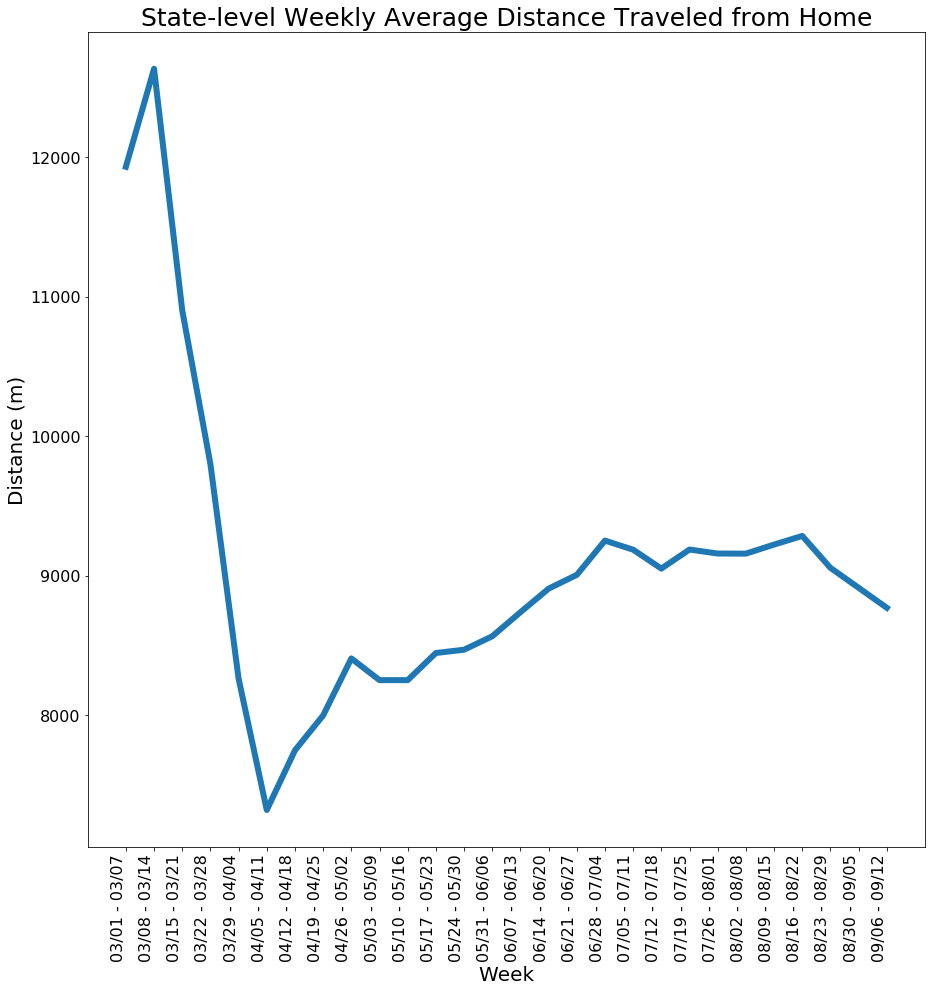

In [14]:
avg_dists = np.zeros(len(datasets)//7)
device_counts = np.zeros(len(datasets)//7)

plt_num = 0
for data, _, _ in datasets:
    avg_dist = (data['avg_distance_traveled_from_home'] * data['device_count']).sum()
    avg_dists[plt_num//7] += avg_dist
    device_counts[plt_num//7] += data['device_count'].sum()
    plt_num += 1
    
avg_dists = avg_dists / device_counts

gap = avg_dists[9] - avg_dists[10]

for i in range(10, len(avg_dists)):
    avg_dists[i] += gap

fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.set_title('State-level Weekly Average Distance Traveled from Home', {'fontsize': 25})
ax.set_xlabel('Week', {'fontsize': 20})
ax.set_ylabel('Distance (m)', {'fontsize': 20})
ax.set_xticks(list(range(len(datasets)//7)))
ax.set_xticklabels(week_labels,  {'fontsize': 16}, rotation = 90, ha="right")
ax.tick_params('y', labelsize=16)
lines = ax.plot(avg_dists, linewidth=6)
plt.show()

In [21]:
gap/7

815.3014999061623

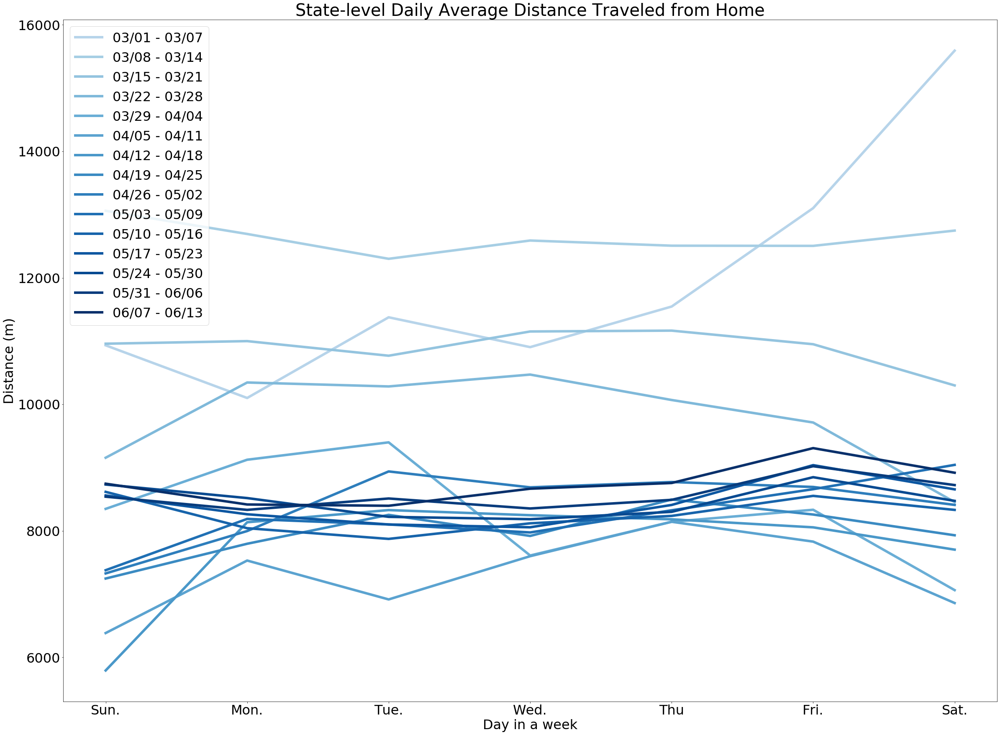

In [25]:
avg_dists = np.zeros((len(datasets)//7, 7))

for plt_num, (data, _, _) in enumerate(datasets):
    avg_dist = (data['avg_distance_traveled_from_home'] * data['device_count']).sum() / data['device_count'].sum()
    if plt_num//7 < 10:
        avg_dists[plt_num//7, plt_num%7] = avg_dist
    else:
        avg_dists[plt_num//7, plt_num%7] = avg_dist + gap

colors = pl.cm.Blues(np.linspace(0.3,1,len(datasets)//7))

fig, ax = plt.subplots(1, 1, figsize=(40,30))
ax.set_title('State-level Daily Average Distance Traveled from Home', {'fontsize': 40})
ax.set_xlabel('Day in a week', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(7)))
ax.set_xticklabels(['Sun.', 'Mon.', 'Tue.', 'Wed.', 'Thu', 'Fri.', 'Sat.'],  {'fontsize': 32})
ax.tick_params('y', labelsize=32)
lines = []
for d_idx, d in enumerate(avg_dists):
    line, = ax.plot(d, linewidth=6, c=colors[d_idx])
    lines.append(line)
plt.legend(lines, week_labels, fontsize=32)
plt.show()

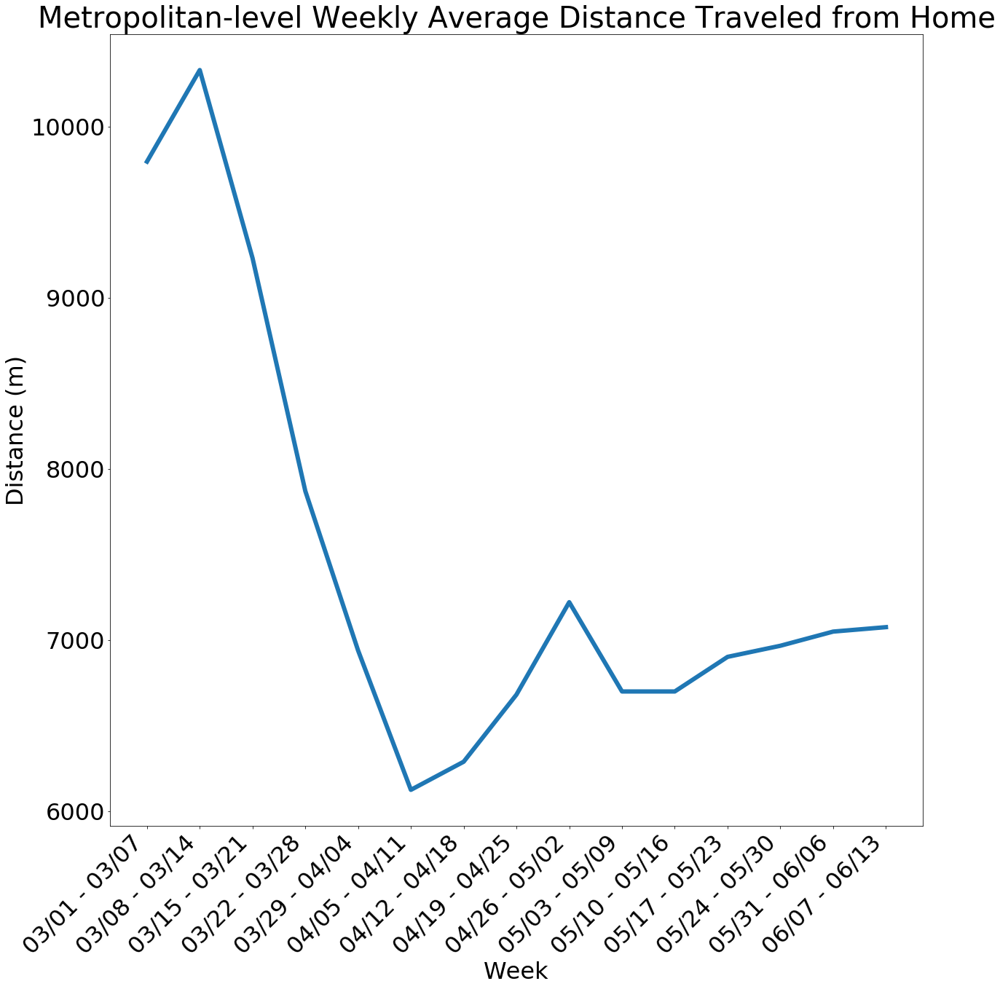

In [26]:
avg_dists = np.zeros(len(datasets)//7)
device_counts = np.zeros(len(datasets)//7)

plt_num = 0
for data, _, _ in datasets:
    data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    avg_dist = (data['avg_distance_traveled_from_home'] * data['device_count']).sum()
    avg_dists[plt_num//7] += avg_dist
    device_counts[plt_num//7] += data['device_count'].sum()
    plt_num += 1
    
avg_dists = avg_dists / device_counts

gap = avg_dists[9] - avg_dists[10]

for i in range(10, len(avg_dists)):
    avg_dists[i] += gap

fig, ax = plt.subplots(1, 1, figsize=(20,20))
ax.set_title('Metropolitan-level Weekly Average Distance Traveled from Home', {'fontsize': 40})
ax.set_xlabel('Week', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets)//7)))
ax.set_xticklabels(week_labels,  {'fontsize': 32}, rotation = 45, ha="right")
ax.tick_params('y', labelsize=32)
lines = ax.plot(avg_dists, linewidth=6)
plt.show()

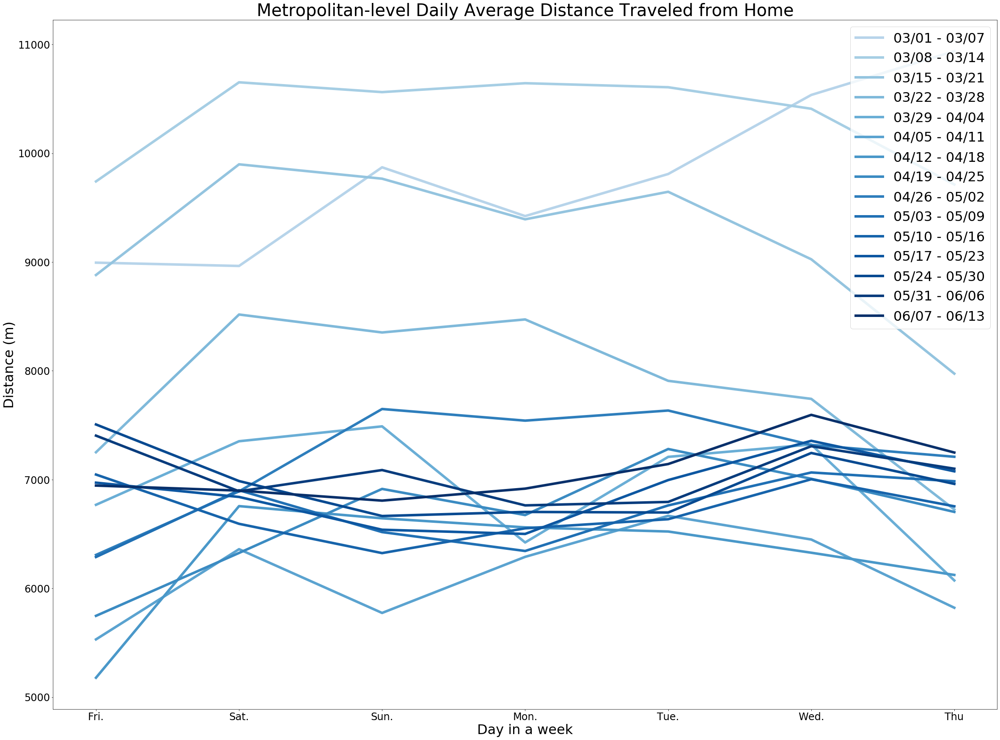

In [28]:
avg_dists = np.zeros((len(datasets)//7, 7))

plt_num = 0
for data, _, _ in datasets:
    data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    avg_dist = (data['avg_distance_traveled_from_home'] * data['device_count']).sum() / data['device_count'].sum()
    if plt_num//7 < 10:
        avg_dists[plt_num//7, plt_num%7] = avg_dist
    else:
        avg_dists[plt_num//7, plt_num%7] = avg_dist + gap
    
    plt_num += 1

fig, ax = plt.subplots(1, 1, figsize=(40,30))
ax.set_title('Metropolitan-level Daily Average Distance Traveled from Home', {'fontsize': 40})
ax.set_xlabel('Day in a week', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(7)))
ax.set_xticklabels(['Fri.', 'Sat.', 'Sun.', 'Mon.', 'Tue.', 'Wed.', 'Thu'],  {'fontsize': 24})
ax.tick_params('y', labelsize=24)
lines = []
for d_idx, d in enumerate(avg_dists):
    line, = ax.plot(d, linewidth=6, c=colors[d_idx])
    lines.append(line)
plt.legend(lines, week_labels, fontsize=32)
plt.show()

In [17]:
week_labels

['03/01',
 '03/08',
 '03/15',
 '03/22',
 '03/29',
 '04/05',
 '04/12',
 '04/19',
 '04/26',
 '05/03',
 '05/10',
 '05/17',
 '05/24',
 '05/31',
 '06/07',
 '06/14',
 '06/21',
 '06/28',
 '07/05',
 '07/12',
 '07/19',
 '07/26',
 '08/02',
 '08/09',
 '08/16',
 '08/23',
 '08/30',
 '09/06',
 '09/13',
 '09/20',
 '09/27',
 '10/04',
 '10/11',
 '10/18',
 '10/25',
 '11/01',
 '11/08',
 '11/15',
 '11/22',
 '11/29',
 '12/06',
 '12/13',
 '12/20',
 '12/27',
 '01/03',
 '01/10',
 '01/17',
 '01/24',
 '01/31',
 '02/07',
 '02/14',
 '02/21',
 '02/28',
 '03/07',
 '03/14',
 '03/21',
 '03/28',
 '04/04']

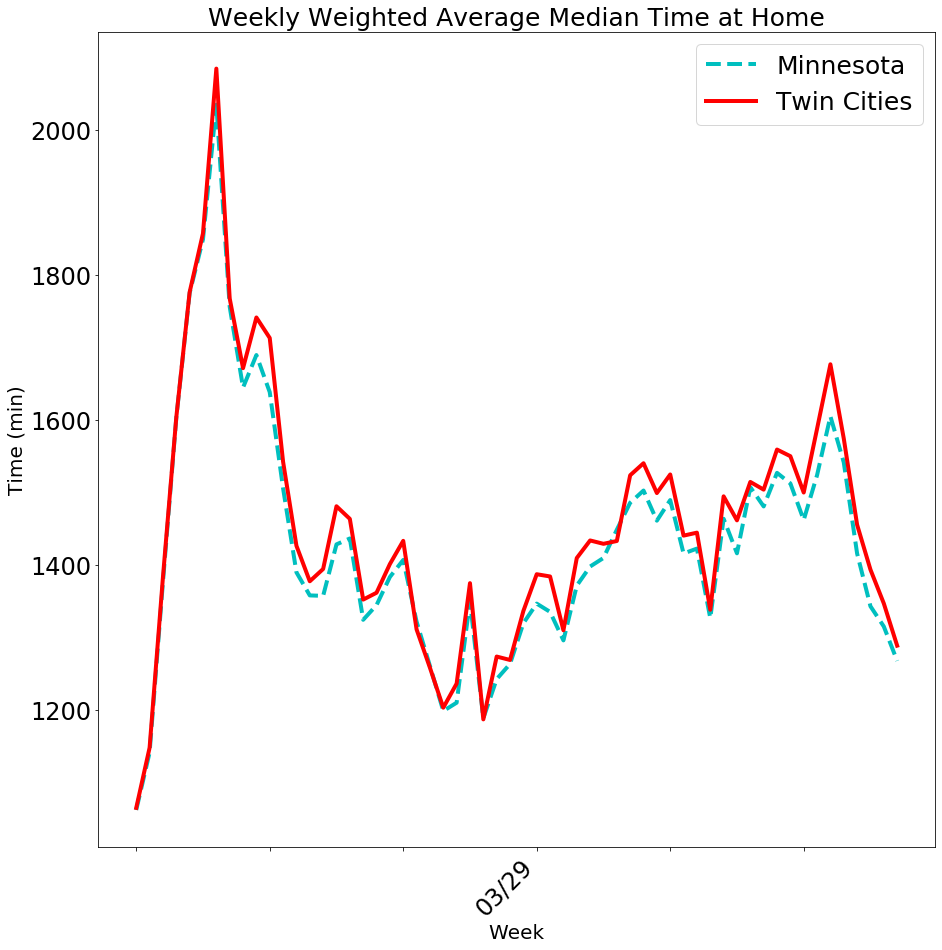

In [16]:
state_avg_times = np.zeros(len(datasets)//7)
state_device_counts = np.zeros(len(datasets)//7)

metro_avg_times = np.zeros(len(datasets)//7)
metro_device_counts = np.zeros(len(datasets)//7)

plt_num = 0
for data, _, _ in datasets:
    state_avg_times[plt_num//7] += (data['avg_median_home_dwell_time'] * data['device_count']).sum() / data['device_count'].sum()
#     state_device_counts[plt_num//7] += data['device_count'].sum()
    
    metro_data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    metro_avg_times[plt_num//7] += (metro_data['avg_median_home_dwell_time'] * metro_data['device_count']).sum() / metro_data['device_count'].sum()
#     metro_device_counts[plt_num//7] += metro_data['device_count'].sum()
    
    plt_num += 1
    
# state_avg_times = state_avg_times / state_device_counts
# metro_avg_times = metro_avg_times / metro_device_counts

fig, ax = plt.subplots(1, 1, figsize=(15,15))
ax.set_title('Weekly Weighted Average Median Time at Home', {'fontsize': 25})
ax.set_xlabel('Week', {'fontsize': 20})
ax.set_ylabel('Time (min)', {'fontsize': 20})
labels = []
for l_idx, l in enumerate(week_labels):
    if l_idx % 4 == 0:
        labels.append(l)
    else:
        labels.append('')
ax.set_xticklabels(labels,  {'fontsize': 24}, rotation = 45, ha="right")
ax.tick_params('y', labelsize=24)
ax.plot(state_avg_times, 'c--',linewidth=4, label='Minnesota')
ax.plot(metro_avg_times, 'r', linewidth=4, label='Twin Cities')


plt.legend(fontsize=25)

plt.show()

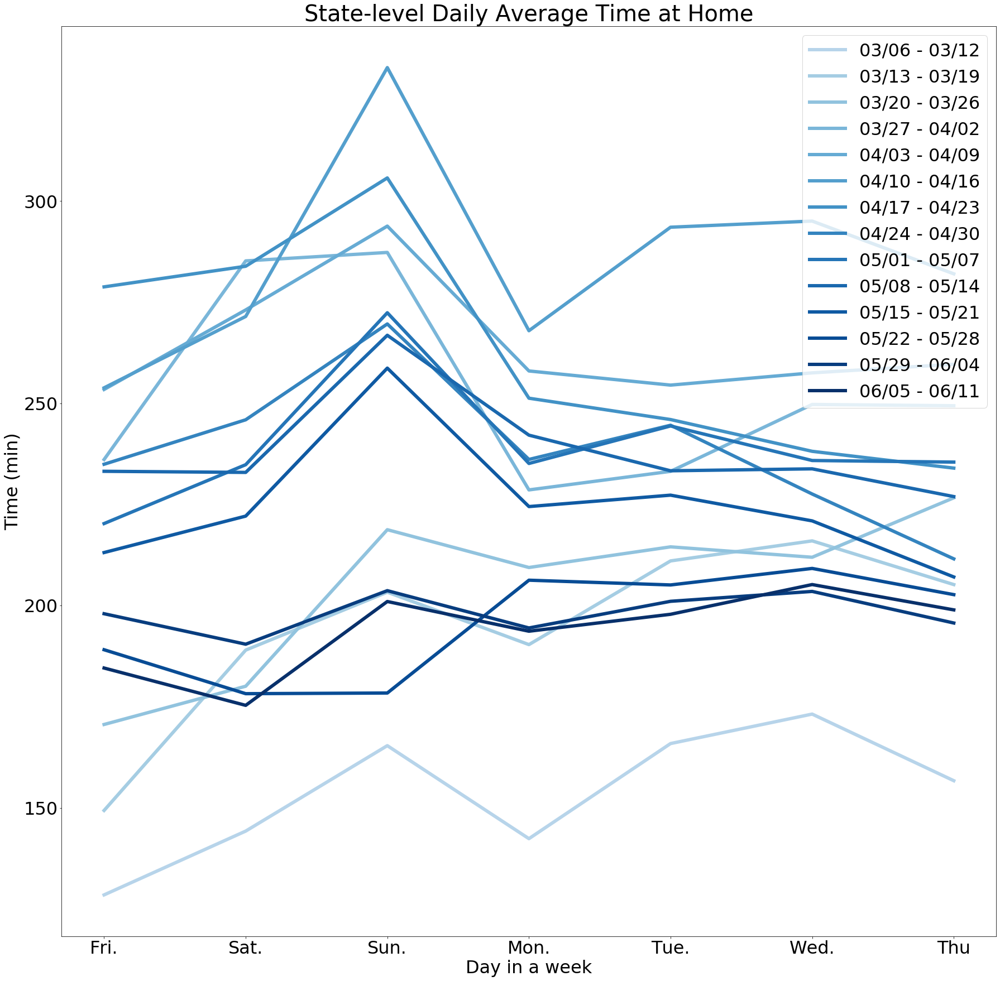

In [31]:
avg_times = np.zeros((len(datasets)//7, 7))

plt_num = 0
for data, _, _ in datasets:
    avg_time = (data['avg_median_home_dwell_time'] * data['device_count']).sum() / data['device_count'].sum()
    avg_times[plt_num//7, plt_num%7] = avg_time
    
    plt_num += 1

fig, ax = plt.subplots(1, 1, figsize=(30,30))
ax.set_title('State-level Daily Average Time at Home', {'fontsize': 40})
ax.set_xlabel('Day in a week', {'fontsize': 32})
ax.set_ylabel('Time (min)', {'fontsize': 32})
ax.set_xticks(list(range(7)))
ax.set_xticklabels(['Fri.', 'Sat.', 'Sun.', 'Mon.', 'Tue.', 'Wed.', 'Thu'],  {'fontsize': 32})
ax.tick_params('y', labelsize=32)
lines = []
for d_idx, d in enumerate(avg_times):
    line, = ax.plot(d, linewidth=6, c=colors[d_idx])
    lines.append(line)
plt.legend(lines, week_labels, fontsize=32)
plt.show()

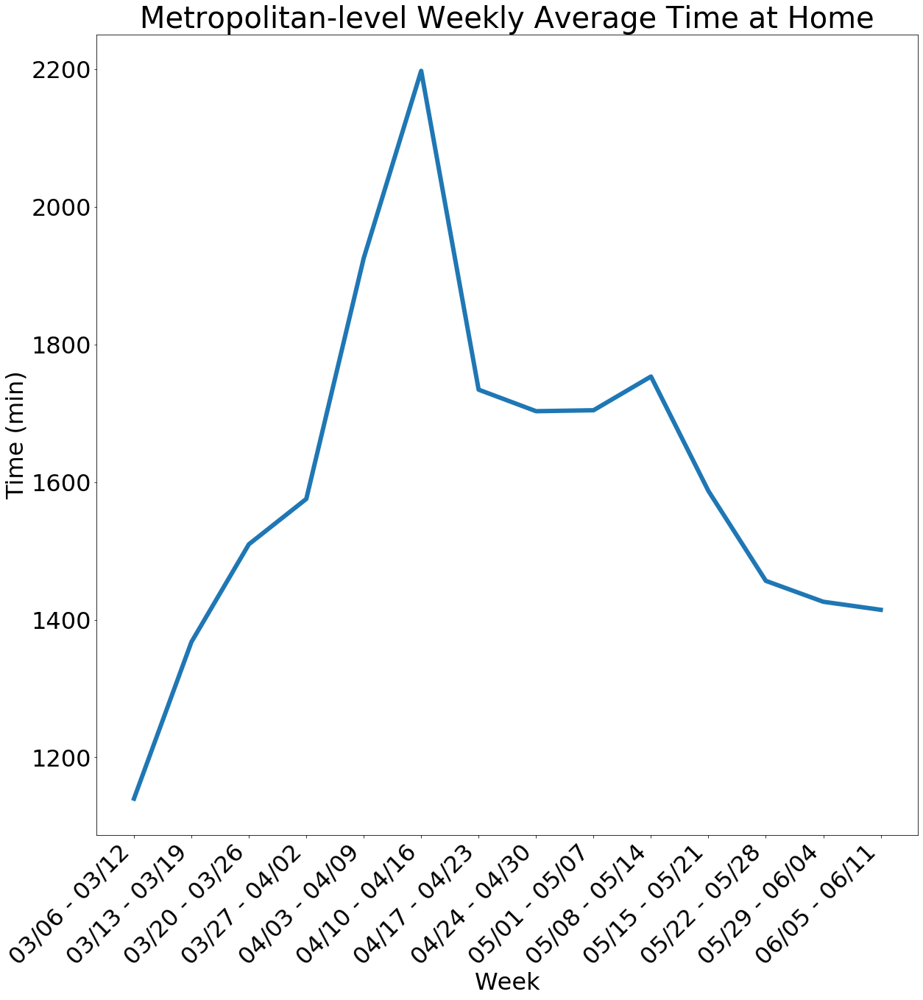

In [32]:
avg_times = np.zeros(len(datasets)//7)
device_counts = np.zeros(len(datasets)//7)

plt_num = 0
for data, _, _ in datasets:
    data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    avg_time = (data['avg_median_home_dwell_time'] * data['device_count']).sum()
    avg_times[plt_num//7] += avg_time
    device_counts[plt_num//7] = data['device_count'].sum()
    plt_num += 1
    
avg_times = avg_times / device_counts

fig, ax = plt.subplots(1, 1, figsize=(20,20))
ax.set_title('Metropolitan-level Weekly Average Time at Home', {'fontsize': 40})
ax.set_xlabel('Week', {'fontsize': 32})
ax.set_ylabel('Time (min)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets)//7)))
ax.set_xticklabels(week_labels,  {'fontsize': 32}, rotation = 45, ha="right")
ax.tick_params('y', labelsize=32)
lines = ax.plot(avg_times, linewidth=6)
plt.show()

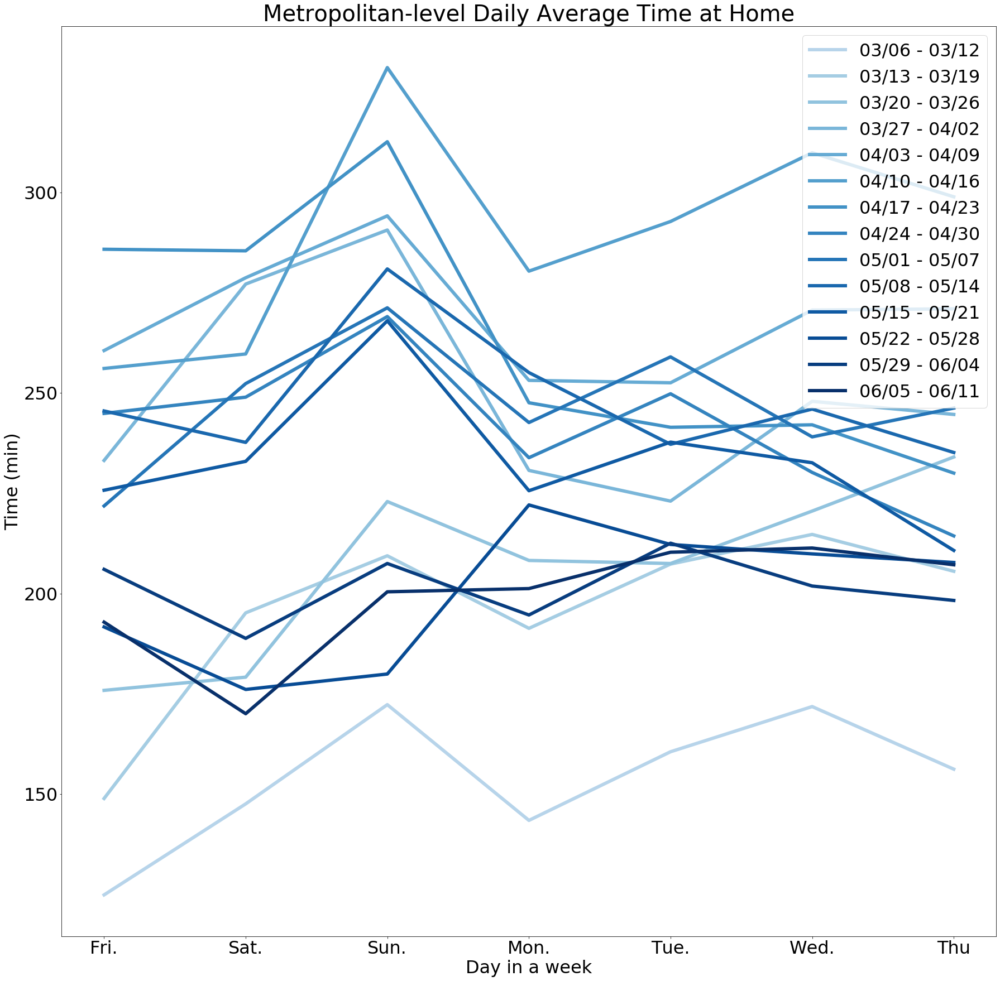

In [33]:
avg_times = np.zeros((len(datasets)//7, 7))

plt_num = 0
for data, _, _ in datasets:
    data = data.merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')[data.columns]
    avg_time = (data['avg_median_home_dwell_time'] * data['device_count']).sum() / data['device_count'].sum()
    avg_times[plt_num//7, plt_num%7] = avg_time
    
    plt_num += 1

fig, ax = plt.subplots(1, 1, figsize=(30,30))
ax.set_title('Metropolitan-level Daily Average Time at Home', {'fontsize': 40})
ax.set_xlabel('Day in a week', {'fontsize': 32})
ax.set_ylabel('Time (min)', {'fontsize': 32})
ax.set_xticks(list(range(7)))
ax.set_xticklabels(['Fri.', 'Sat.', 'Sun.', 'Mon.', 'Tue.', 'Wed.', 'Thu'],  {'fontsize': 32})
ax.tick_params('y', labelsize=32)
lines = []
for d_idx, d in enumerate(avg_times):
    line, = ax.plot(d, linewidth=6, c=colors[d_idx])
    lines.append(line)
plt.legend(lines, week_labels, fontsize=32)
plt.show()

## Moran's I

In [65]:
census_device_df = census_df.merge(agg_devices, left_on='GEOID', right_on='ct_fips')
census_device_shp = mn_ct_shp.merge(census_device_df, left_on='GEOID', right_on='GEOID')
geoids = census_device_shp['GEOID'].tolist()
state_adjacency_matrix = np.zeros((len(geoids), len(geoids)))

for idx, row in census_device_shp.iterrows():
    row_idx = geoids.index(row['GEOID'])
    neighbors = census_device_shp[census_device_shp.geometry.touches(row['geometry'])]['GEOID'].tolist() 
    for n_geoid in neighbors:
        n_idx = geoids.index(n_geoid)
        state_adjacency_matrix[row_idx, n_idx] = 1

census_device_shp['selection_ratio'] = census_device_shp['device_count'] / census_device_shp['Population']
selection_ratio = np.array(census_device_shp['selection_ratio'].tolist())
state_adjacency_matrix = state_adjacency_matrix[np.logical_not(np.isnan(selection_ratio)), :]
state_adjacency_matrix = state_adjacency_matrix[:, np.logical_not(np.isnan(selection_ratio))]
selection_ratio = selection_ratio[np.logical_not(np.isnan(selection_ratio))]

In [77]:
w_state_adjacency_matrix = state_adjacency_matrix / np.sum(state_adjacency_matrix, axis=1)[:, None]

w_selection_ratio = selection_ratio - np.mean(selection_ratio)

state_moran_i = np.matmul(np.matmul(w_selection_ratio.reshape((1, -1)), w_state_adjacency_matrix), w_selection_ratio.reshape((-1, 1))) / np.matmul(w_selection_ratio.reshape((1, -1)), w_selection_ratio.reshape((-1, 1)))

state_moran_i

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 1332 is different from 701)

In [76]:
census_device_df = census_df.merge(agg_devices, left_on='GEOID', right_on='ct_fips')
census_device_shp = metropolitan_ct_shp.merge(census_device_df, left_on='GEOID', right_on='GEOID')
geoids = census_device_shp['GEOID'].tolist()
metro_adjacency_matrix = np.zeros((len(geoids), len(geoids)))

for idx, row in census_device_shp.iterrows():
    row_idx = geoids.index(row['GEOID'])
    neighbors = census_device_shp[census_device_shp.geometry.touches(row['geometry'])]['GEOID'].tolist() 
    for n_geoid in neighbors:
        n_idx = geoids.index(n_geoid)
        metro_adjacency_matrix[row_idx, n_idx] = 1

census_device_shp['selection_ratio'] = census_device_shp['device_count'] / census_device_shp['Population']
selection_ratio = np.array(census_device_shp['selection_ratio'].tolist())
metro_adjacency_matrix = metro_adjacency_matrix[np.logical_not(np.isnan(selection_ratio)), :]
metro_adjacency_matrix = metro_adjacency_matrix[:, np.logical_not(np.isnan(selection_ratio))]
selection_ratio = selection_ratio[np.logical_not(np.isnan(selection_ratio))]

## Rurality affect social distancing

In [29]:
rurality_df = rurality_df[['GEOID','CountyId', 'Rurality']]

In [62]:
rurality_levels = ['{\"Most Deprived\"}', '{\"More Deprived\"}', '{\"Less Deprived\"}', '{\"Least Deprived\"}']
rurality_avg_dists = np.zeros((len(rurality_levels), len(datasets)))
rurality_avg_times = np.zeros((len(rurality_levels), len(datasets)))

x_ticks = []

for d_idx, (data, m, d) in enumerate(datasets):
    x_ticks.append('{:02d}/{:02d}'.format(m,d))
    for r_idx, rural in enumerate(rurality_levels):
        tmp = data.merge(rurality_df, left_on='ct_fips', right_on='GEOID')
        sub = tmp[tmp['Rurality']==rural]
        rurality_avg_dists[r_idx, d_idx] = (sub['avg_distance_traveled_from_home'] * sub['device_count']).sum() / sub['device_count'].sum()
        rurality_avg_times[r_idx, d_idx] = (sub['avg_median_home_dwell_time'] * sub['device_count']).sum() / sub['device_count'].sum()

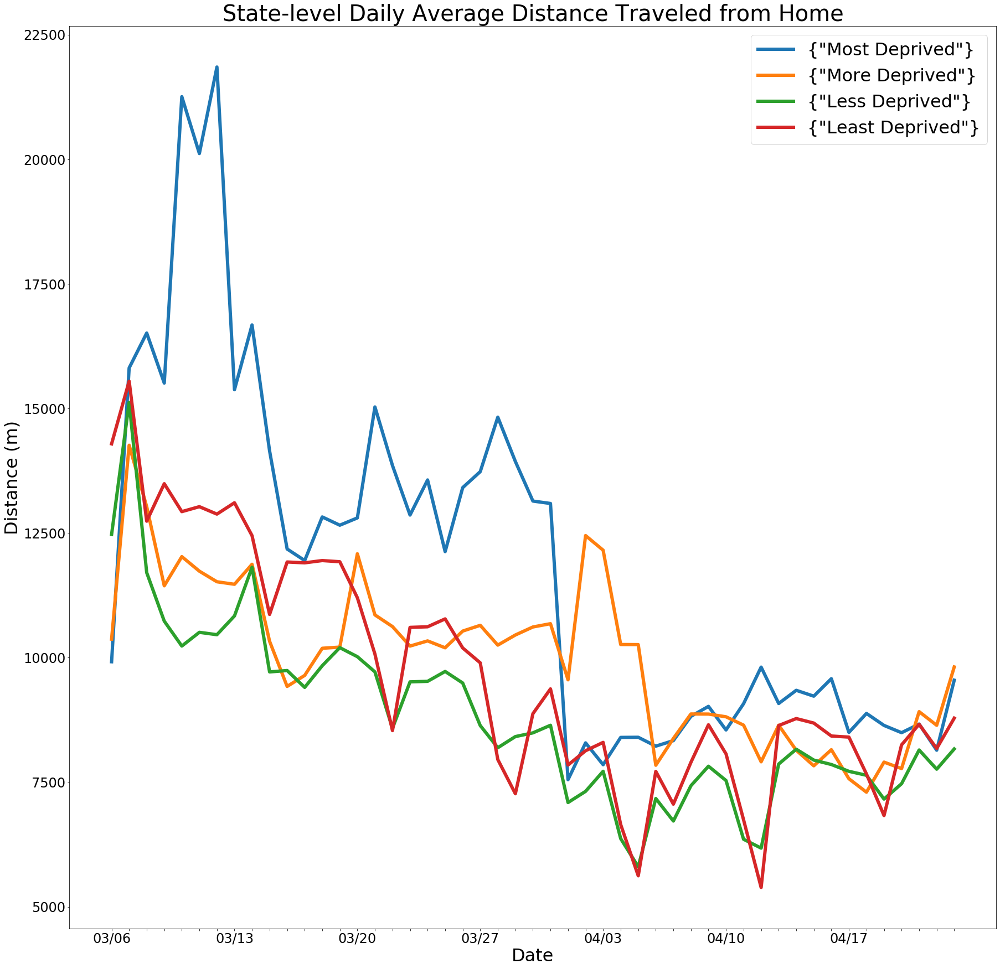

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(20,20))
ax.set_title('State-level Daily Average Distance Traveled from Home', {'fontsize': 40})
ax.set_xlabel('Date', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets))))
tmp_x_ticks = []
for i, x in enumerate(x_ticks):
    if i%7 == 0:
        tmp_x_ticks.append(x)
    else:
        tmp_x_ticks.append('')
ax.set_xticklabels(tmp_x_ticks,  {'fontsize': 24})
ax.tick_params('y', labelsize=24)
lines = ax.plot(rurality_avg_dists.T, linewidth=6)
plt.legend(lines, rurality_levels, fontsize=32)
plt.show()

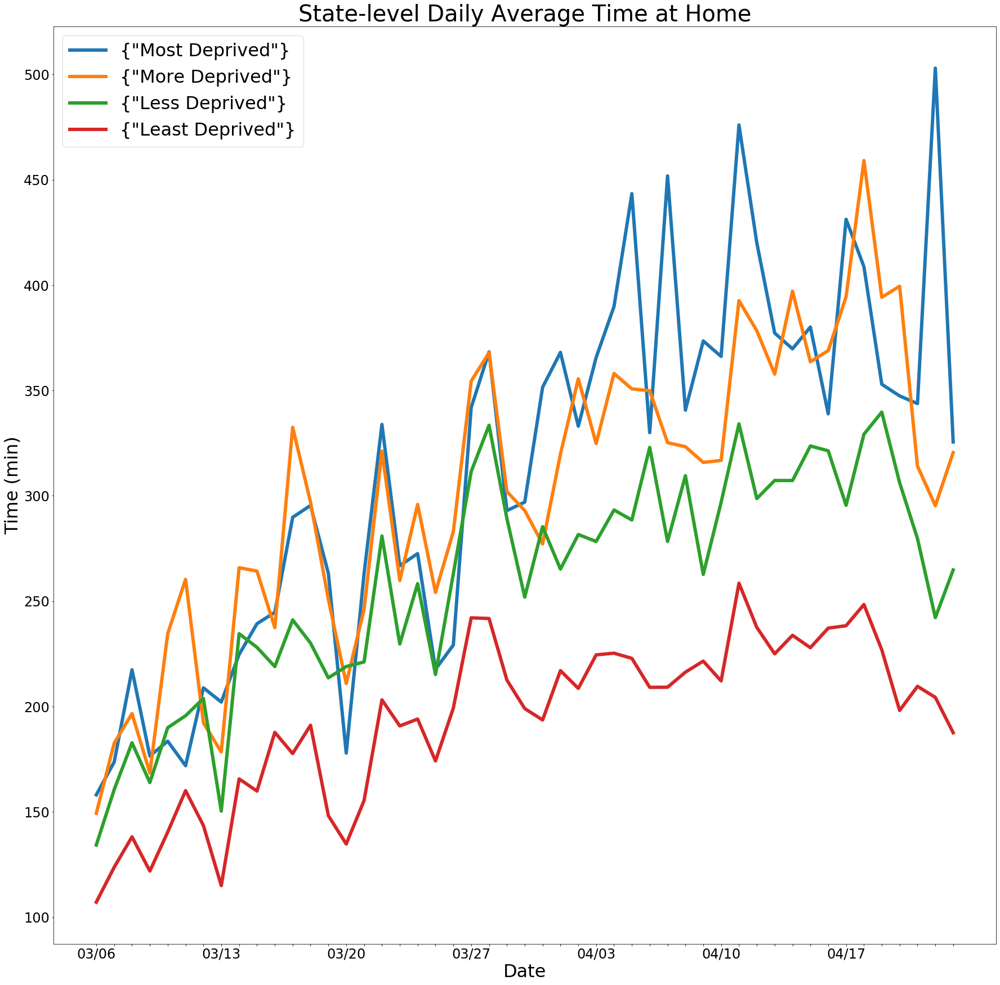

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(30,30))
ax.set_title('State-level Daily Average Time at Home', {'fontsize': 40})
ax.set_xlabel('Date', {'fontsize': 32})
ax.set_ylabel('Time (min)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets))))
tmp_x_ticks = []
for i, x in enumerate(x_ticks):
    if i%7 == 0:
        tmp_x_ticks.append(x)
    else:
        tmp_x_ticks.append('')
ax.set_xticklabels(tmp_x_ticks,  {'fontsize': 24})
ax.tick_params('y', labelsize=24)
lines = ax.plot(rurality_avg_times.T, linewidth=6)
plt.legend(lines, rurality_levels, fontsize=32)
plt.show()

In [76]:
rurality_levels = ['{\"Most Deprived\"}', '{\"More Deprived\"}', '{\"Less Deprived\"}', '{\"Least Deprived\"}']
rurality_avg_dists = np.zeros((len(rurality_levels), len(datasets)))
rurality_avg_times = np.zeros((len(rurality_levels), len(datasets)))

x_ticks = []

for d_idx, (data, m, d) in enumerate(datasets):
    x_ticks.append('{:02d}/{:02d}'.format(m,d))
    for r_idx, rural in enumerate(rurality_levels):
        tmp = data.merge(rurality_df, left_on='ct_fips', right_on='GEOID').merge(metropolitan_ct_shp, left_on='ct_fips', right_on='GEOID')
        sub = tmp[tmp['Rurality']==rural]
        rurality_avg_dists[r_idx, d_idx] = (sub['avg_distance_traveled_from_home'] * sub['device_count']).sum() / sub['device_count'].sum()
        rurality_avg_times[r_idx, d_idx] = (sub['avg_median_home_dwell_time'] * sub['device_count']).sum() / sub['device_count'].sum()

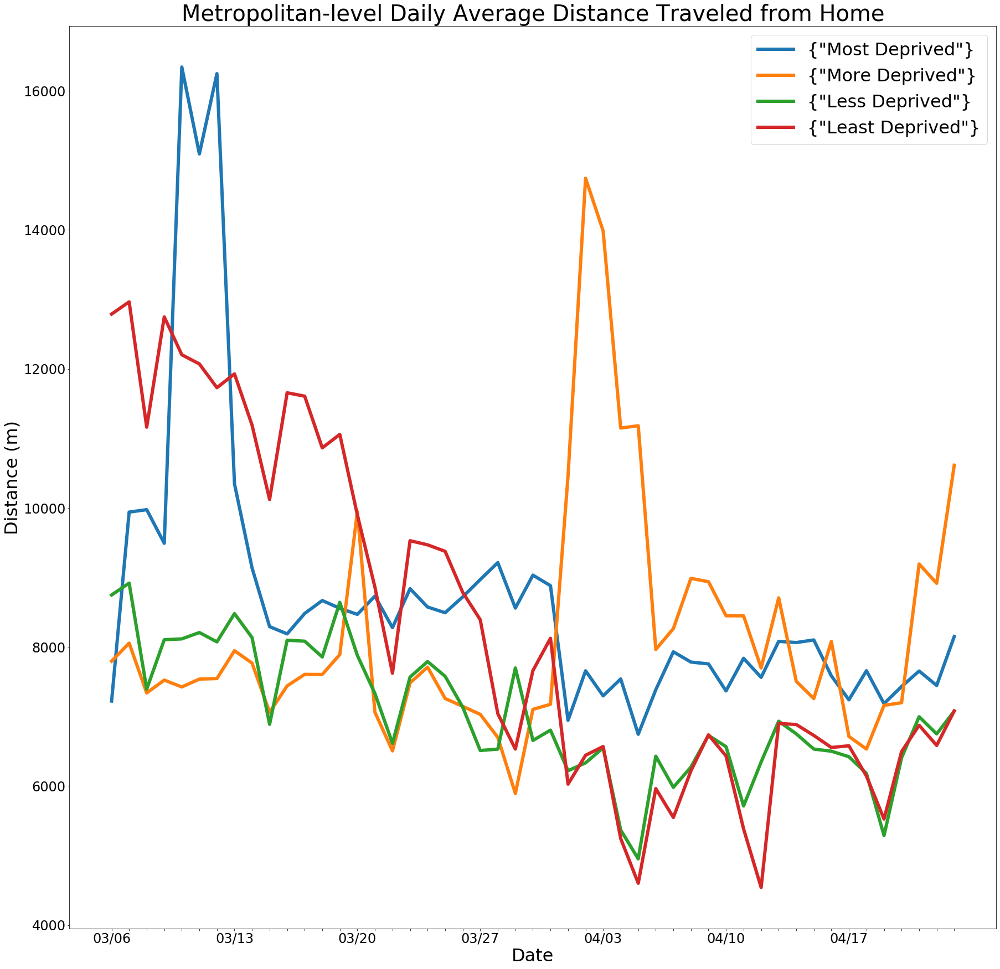

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(30,30))
ax.set_title('Metropolitan-level Daily Average Distance Traveled from Home', {'fontsize': 40})
ax.set_xlabel('Date', {'fontsize': 32})
ax.set_ylabel('Distance (m)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets))))
tmp_x_ticks = []
for i, x in enumerate(x_ticks):
    if i%7 == 0:
        tmp_x_ticks.append(x)
    else:
        tmp_x_ticks.append('')
ax.set_xticklabels(tmp_x_ticks,  {'fontsize': 24})
ax.tick_params('y', labelsize=24)
lines = ax.plot(rurality_avg_dists.T, linewidth=6)
plt.legend(lines, rurality_levels, fontsize=32)
plt.show()

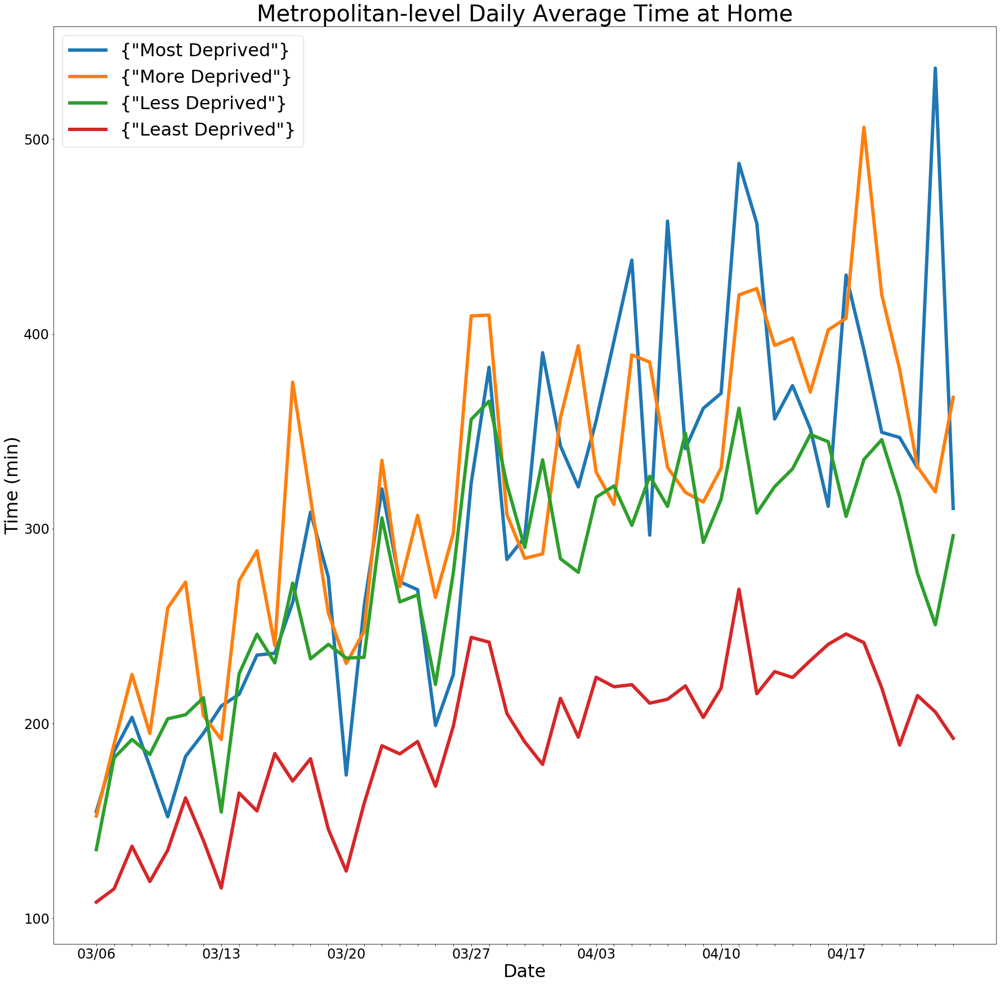

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(30,30))
ax.set_title('Metropolitan-level Daily Average Time at Home', {'fontsize': 40})
ax.set_xlabel('Date', {'fontsize': 32})
ax.set_ylabel('Time (min)', {'fontsize': 32})
ax.set_xticks(list(range(len(datasets))))
tmp_x_ticks = []
for i, x in enumerate(x_ticks):
    if i%7 == 0:
        tmp_x_ticks.append(x)
    else:
        tmp_x_ticks.append('')
ax.set_xticklabels(tmp_x_ticks,  {'fontsize': 24})
ax.tick_params('y', labelsize=24)
lines = ax.plot(rurality_avg_times.T, linewidth=6)
plt.legend(lines, rurality_levels, fontsize=32)
plt.show()

## Weekly average

In [ ]:
week_datasets = []

for d_idx, (data, m, d) in enumerate(datasets)